## Introduction

In this notebook, I applied the modivied version of GMM and RF Method for a new cluster: NGC 3766. 

Similar to the modified 

## Reference

* Gao, X. (2018). A Machine-learning-based Investigation of the Open Cluster M67. *The Astrophysical Journal*, 869(1). https://doi.org/10.3847/1538-4357/aae8dd

## Replication

### Importing packages

In [1]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier

In [3]:
#!pip install astroquery

In [4]:
#!pip install shap

In [5]:
# import astroquery
import astropy.units as u
import astropy.coordinates as coord
from astroquery.gaia import Gaia
from astroquery.gaia import TapPlus, GaiaClass   
from astroquery.vizier import Vizier


Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


### Finding GAIA Data

In [6]:
## making a GAIA cone_search of 0.5 degree radius around NGC 3766 center

coordinate = coord.SkyCoord.from_name('NGC3766')
print(coordinate)
radius = u.Quantity(1, u.deg)
Gaia.ROW_LIMIT = -1
table = "gaiaedr3.gaia_source"
#table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius)
r = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (174.061, -61.616)>


INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [7]:
## save the ASCII table as a panadas dataframe
all_stars = r.to_pandas()
all_stars.head()


C:\Users\mahmu\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3296: TableReplaceWarning: converted column 'priam_flags' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\mahmu\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3296: TableReplaceWarning: converted column 'flame_flags' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)


,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist
0,1635721458409799680,b'Gaia DR2 5334208407957632512',5334208407957632512,644699818,2015.5,174.063237,0.088780,-61.616430,0.069531,0.422824,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.001139
1,1635721458409799680,b'Gaia DR2 5334208407944646400',5334208407944646400,1317330171,2015.5,174.063284,0.561394,-61.615199,0.549642,0.647497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.001345
2,1635721458409799680,b'Gaia DR2 5334208403634201984',5334208403634201984,477193950,2015.5,174.059196,0.401673,-61.614927,0.246848,-0.324997,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.001381
3,1635721458409799680,b'Gaia DR2 5334208407944851968',5334208407944851968,1358057934,2015.5,174.062191,0.784734,-61.617773,1.677096,-0.599760,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.001856
4,1635721458409799680,b'Gaia DR2 5334208407944647424',5334208407944647424,1251277168,2015.5,174.064509,0.851327,-61.617086,0.862236,-1.222051,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.001982
5,1635721458409799680,b'Gaia DR2 5334208407944647936',5334208407944647936,348791697,2015.5,174.065468,0.146048,-61.617428,0.136304,0.356620,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.002552
6,1635721458409799680,b'Gaia DR2 5334208407957823232',5334208407957823232,685551234,2015.5,174.055930,0.021324,-61.614974,0.018764,0.473014,...,NaN,200111.0,2.014585,1.887866,2.196911,13.423856,11.646379,15.201332,b'https://gea.esac.esa.int/data-server/datalin...,0.002628
7,1635721458409799680,b'Gaia DR2 5334208407943610240',5334208407943610240,1251217392,2015.5,174.065439,0.403392,-61.613921,0.330167,0.597960,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.002959
8,1635721458409799680,b'Gaia DR2 5334208403634202496',5334208403634202496,287663558,2015.5,174.060457,0.253780,-61.619058,0.279082,0.044359,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.003066
9,1635721458409799680,b'Gaia DR2 5334208407957628160',5334208407957628160,271443788,2015.5,174.057971,0.146835,-61.618721,0.146760,0.069425,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.003079


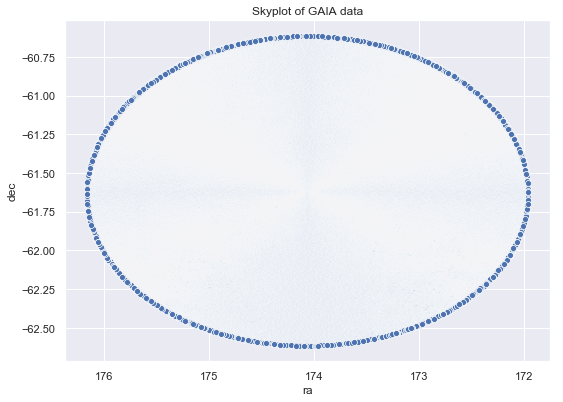

In [8]:
## plotting the skyplot 

sns.set(rc={'figure.figsize':(8.7,6.27)})

skyplot = sns.scatterplot(x='ra', y='dec', data = all_stars)
skyplot.invert_xaxis()
plt.title('Skyplot of GAIA data')
plt.show()

### Applying Filter:

#### Remove Noisy Data

In [9]:
## magnitude error
all_stars['g_mag_error'] = 2.5/np.log(10) / all_stars.phot_g_mean_flux_over_error

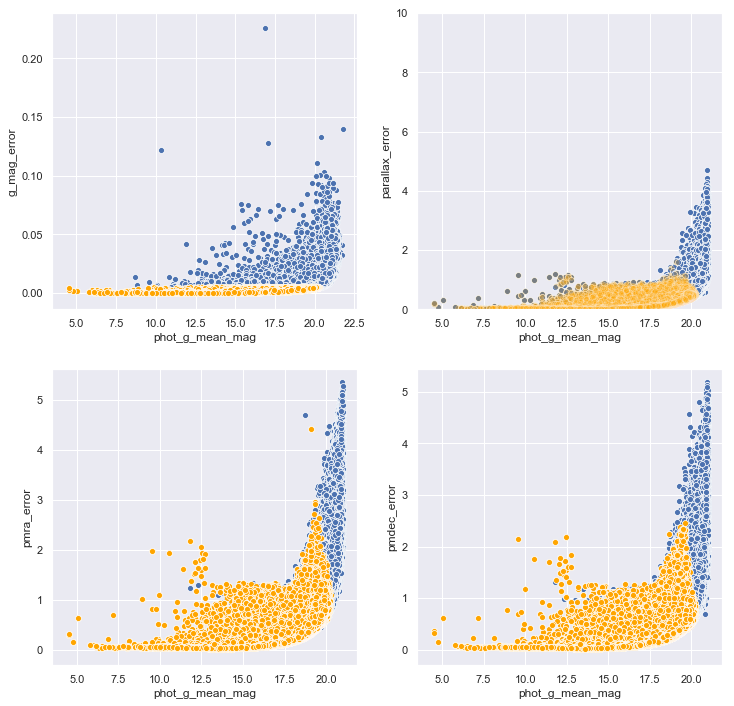

In [10]:
## Remove data with large noise 
mask = all_stars.g_mag_error < 0.005

plt.figure(figsize = (12,12))
plt.subplot(221)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.g_mag_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].g_mag_error, color = 'orange')

plt.subplot(222)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.parallax_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].parallax_error, color = 'orange', alpha = 0.25)
plt.ylim(0,10)


plt.subplot(223)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmra_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmra_error, color = 'orange')

plt.subplot(224)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmdec_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmdec_error, color = 'orange')
plt.show()

In [11]:
## Retrived percentage
len(all_stars[mask])/len(all_stars)

0.49901495388102163

In [12]:
all_stars = all_stars.loc[mask, :]

In [13]:
# calculating the distance from the parallax
all_stars['distance_pc'] = 1/(all_stars.parallax*0.001)

C:\Users\mahmu\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [14]:
print(len(all_stars))

# positive parallax
all_stars = all_stars[all_stars['parallax'] >= 0]
print(len(all_stars))

# dropping rows with null values in required columns
all_stars = all_stars[all_stars.loc[:, 'pmra'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'parallax'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'bp_rp'].notnull()]
print(len(all_stars))

# defining proper motion (pm) range
all_stars = all_stars[(abs(all_stars['pmra']) < 20) & (abs(all_stars['pmdec']) < 20)]
print(len(all_stars))

# taking stars within 60' = 1 deg radius
all_stars = all_stars[all_stars['dist'] < (30/60)]
print(len(all_stars))

498485
407265
384464
381463
97305


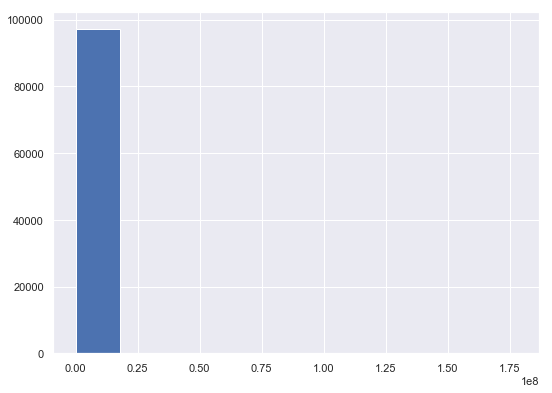

In [15]:
plt.hist(all_stars.distance_pc)
plt.show()

### Selecting cutoff to build GMM Model

In [16]:
def visualize_member(member, non_member, title = None):
    plt.figure(figsize=(14,14))

    if title:
        plt.suptitle(title)
    
    plt.subplot(221)
    sns.scatterplot(data = non_member, x='pmra', y='pmdec', label = 'non_member', color = 'tab:blue')
    sns.scatterplot(data = member, x='pmra', y='pmdec', label = 'member', color = 'tab:red')
    plt.xlabel('pmra (mas/yr)')
    plt.ylabel('pmdec (mas/yr)')

    plt.subplot(222)
    sns.distplot(non_member.parallax, label = 'non_member', color = 'tab:blue', kde = True)
    sns.distplot(member.parallax, label = 'member', color = 'tab:red', kde = True)
    plt.xlabel('Parallax (mas)')
    plt.ylabel('Probability Density [$mas^{-1}$]')
    plt.legend()
    
    plt.subplot(223)
    sns.scatterplot(data = member, x='g_rp', y='phot_g_mean_mag', color = 'tab:red', label = 'member')
    plt.gca().invert_yaxis()
    plt.ylabel('G Magnitude')
    plt.xlabel('G - RP Color')

    plt.subplot(224)
    sns.scatterplot(data = non_member, x='g_rp', y='phot_g_mean_mag', color = 'tab:blue', label = 'non member')
    plt.gca().invert_yaxis()
    plt.ylabel('G Magnitude')
    plt.xlabel('G - RP Color')

    plt.show()

In [17]:
def get_member(working_data, feature_columns, cutoff = 0.6,
               random_state = None):
    features = working_data.loc[:,feature_columns].dropna()

    if len(working_data) < 2:
        raise ValueError('Less than two stars in the data')
    
    # normalizing the features
    scaled_features = pd.DataFrame({})
    for column in features.columns:
        scaled_features[column] = (features[column] - np.median(features[column]))/np.std(features[column])

    from sklearn.mixture import GaussianMixture
    gmm = GaussianMixture(n_components=2, n_init = 5, 
                          random_state = random_state)
    gmm.fit(scaled_features)

    #predictions from gmm
    labels = gmm.predict(scaled_features)
    probs = gmm.predict_proba(scaled_features)

    working_data.loc[:, 'PMemb'] = probs[:, 0]
    working_data.loc[:, 'gmm_label'] = labels

    non_member_ind = working_data.loc[:, 'PMemb'] <= (1-cutoff)
    non_member = working_data.loc[non_member_ind, :]
    
    member_ind = working_data.loc[:, 'PMemb'] >= cutoff
    member = working_data.loc[member_ind, :]

    if np.std(member.pmra) > np.std(non_member.pmra):
        working_data.loc[:, 'PMemb'] = probs[:, 1]
        working_data.loc[:, 'gmm_label'] = 1-labels
        
        non_member_ind = working_data.loc[:, 'PMemb'] <= (1-cutoff)
        non_member = working_data.loc[non_member_ind, :]
        
        member_ind = working_data.loc[:, 'PMemb'] >= cutoff
        member = working_data.loc[member_ind, :]

    return member, non_member, gmm

In [18]:
def get_MSS_metric(member, non_member, feature_columns):
    # get modified silhouttee score from the given member and non_member

    if len(member) < 2 or len(non_member) < 2:
        return 0
    
    metric = np.zeros(len(feature_columns))
    for i in range(len(feature_columns)):
        feature_i = feature_columns[i]
        metric[i] = (np.std(non_member[feature_i]) - np.std(member[feature_i])) \
                / max(np.std(member[feature_i]), np.std(non_member[feature_i]), 1e-7)

    return metric.mean()

In [19]:
widths = np.linspace(5, 1000, 24).round(2)
widths

array([   5.  ,   48.26,   91.52,  134.78,  178.04,  221.3 ,  264.57,
        307.83,  351.09,  394.35,  437.61,  480.87,  524.13,  567.39,
        610.65,  653.91,  697.17,  740.43,  783.7 ,  826.96,  870.22,
        913.48,  956.74, 1000.  ])

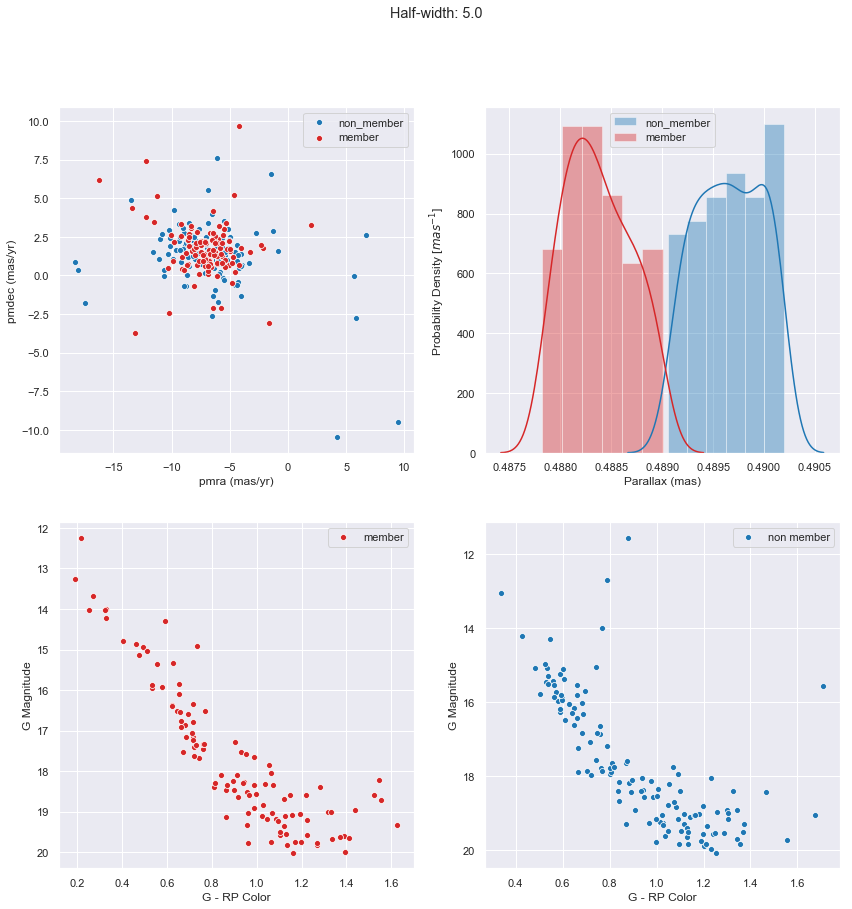

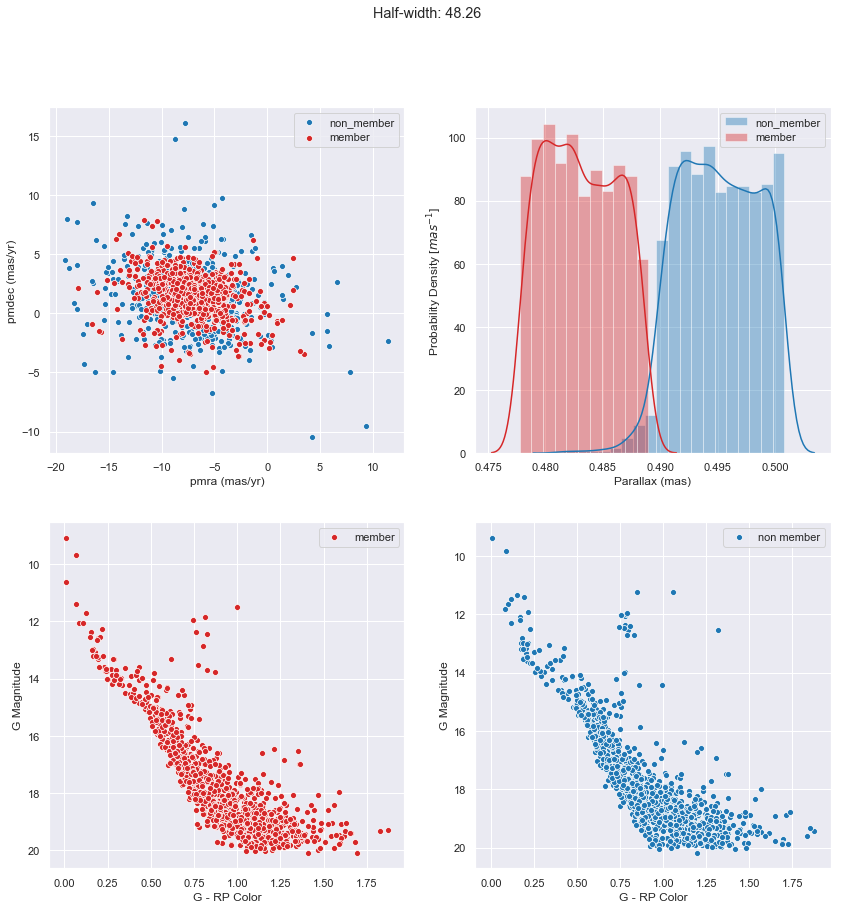

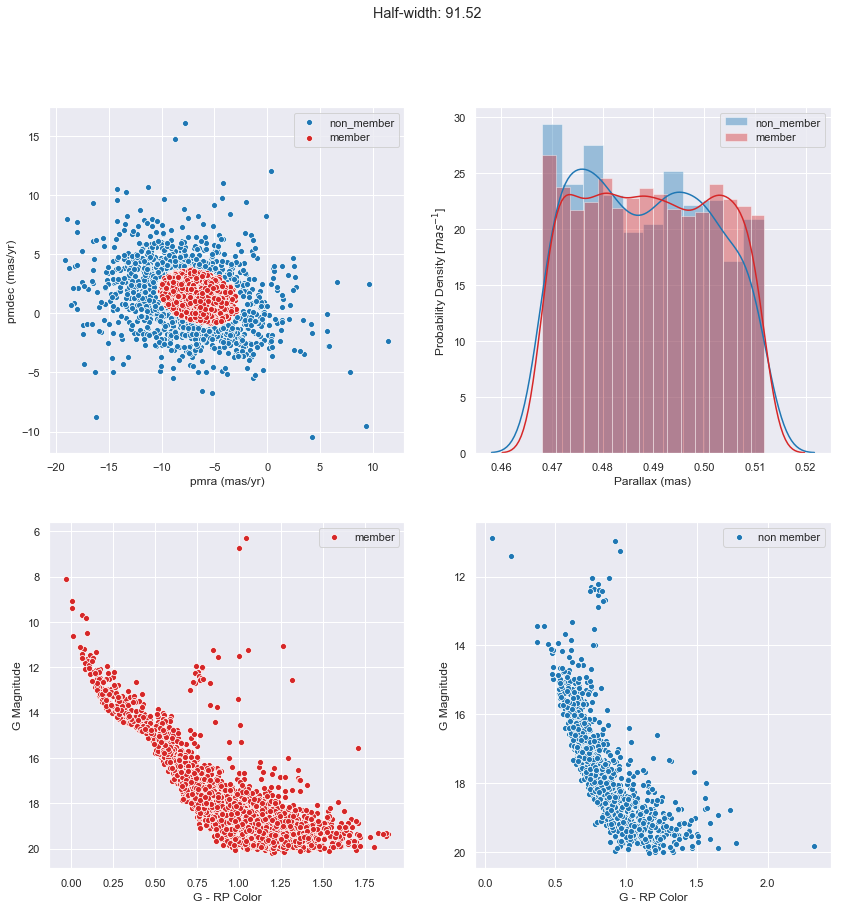

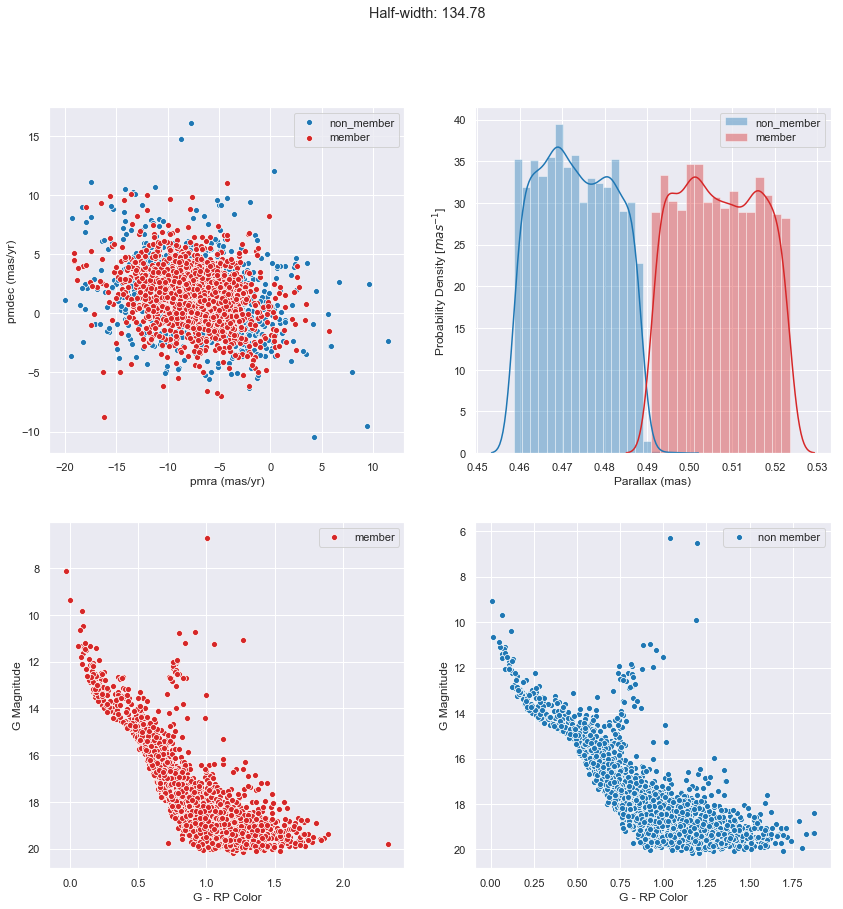

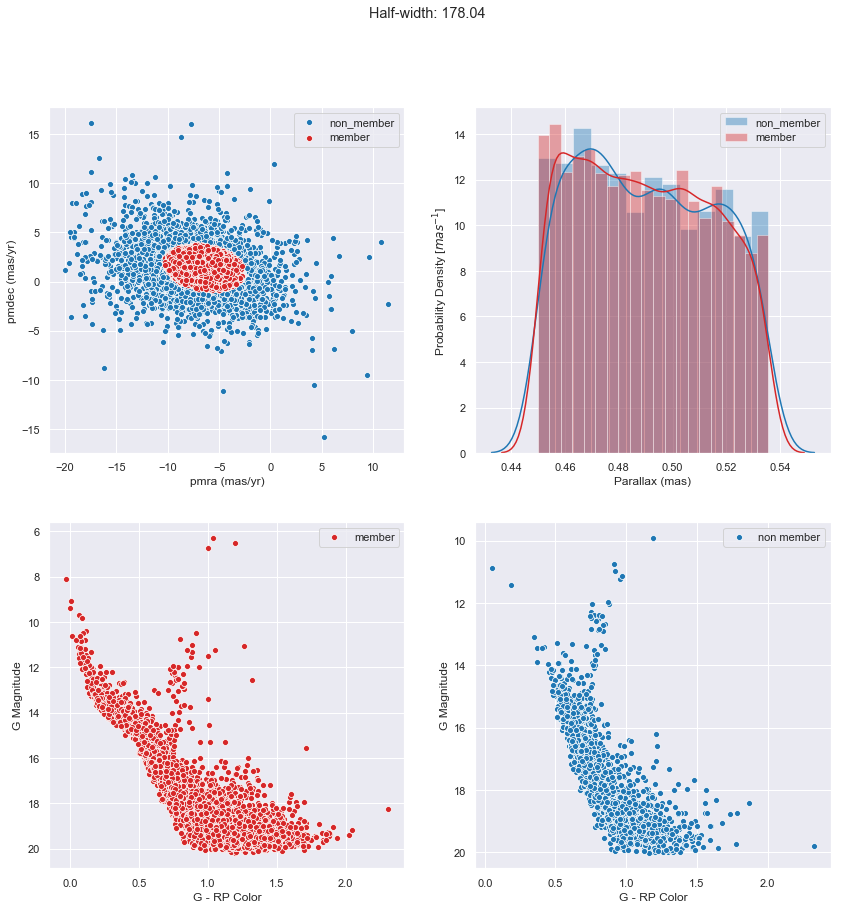

...

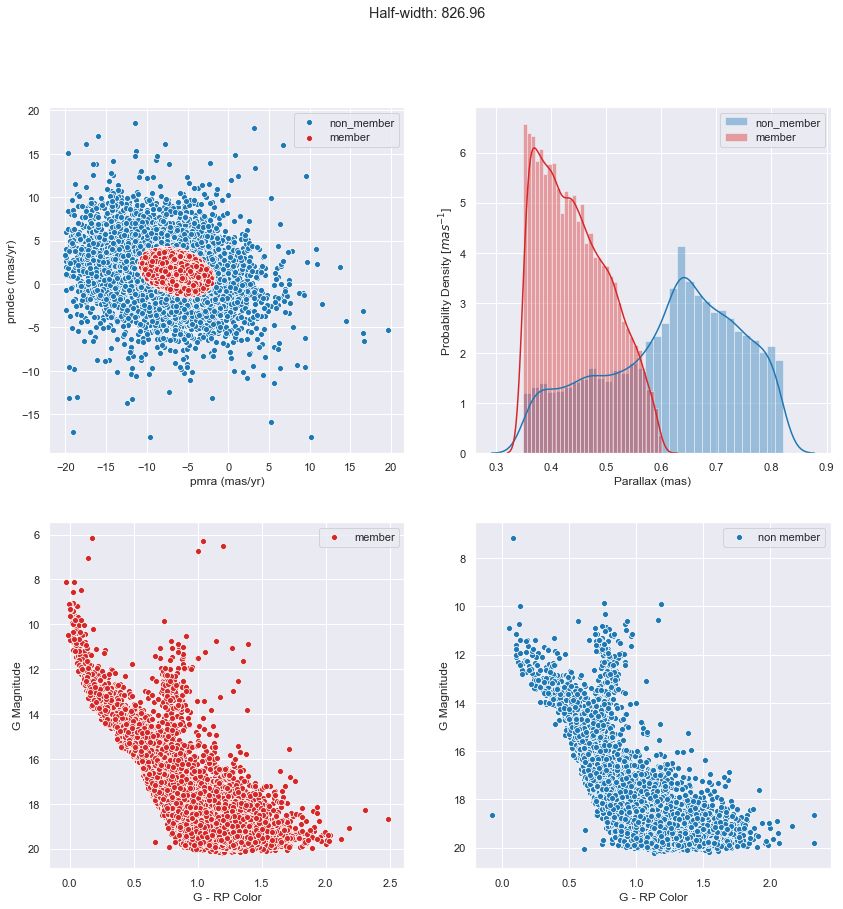

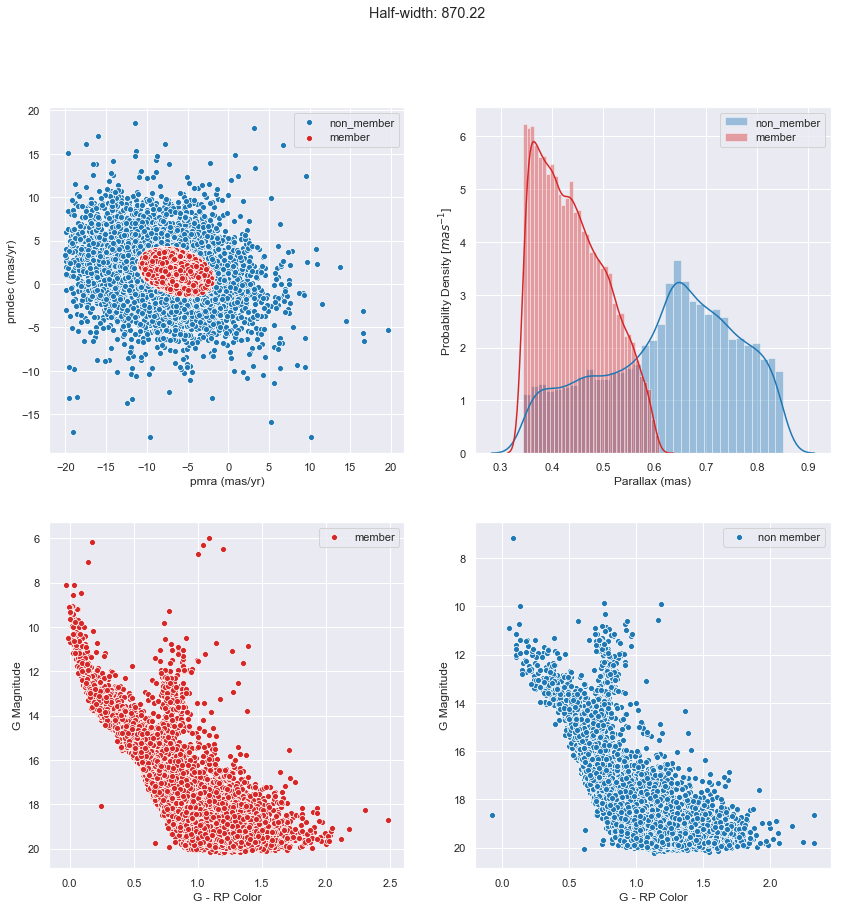

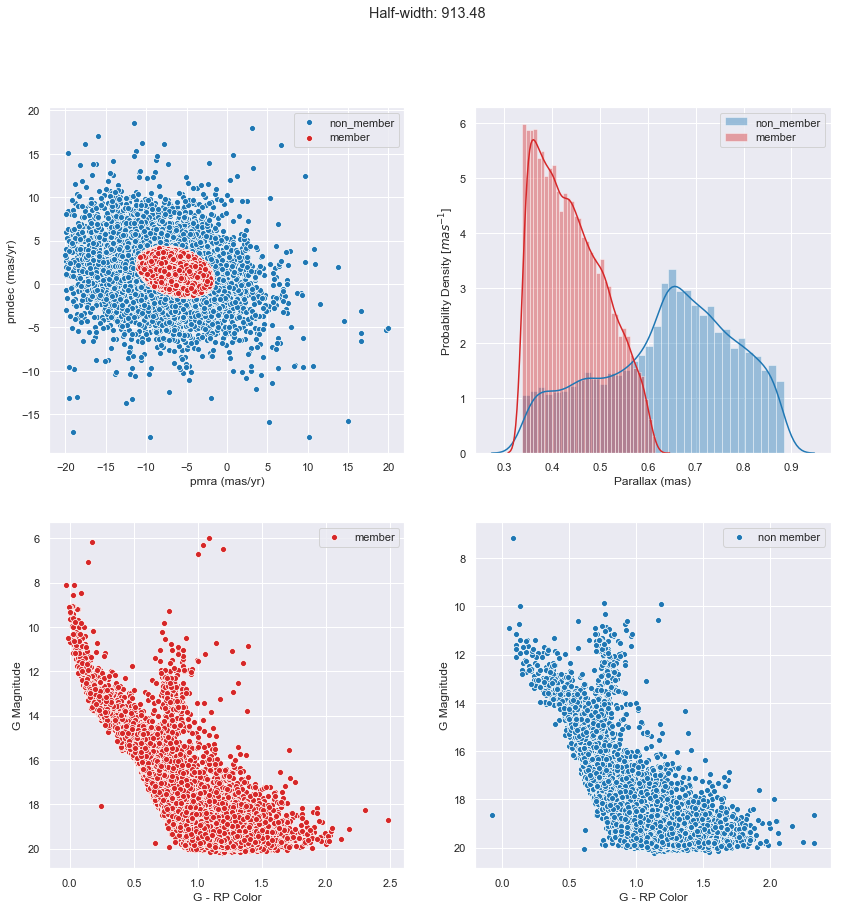

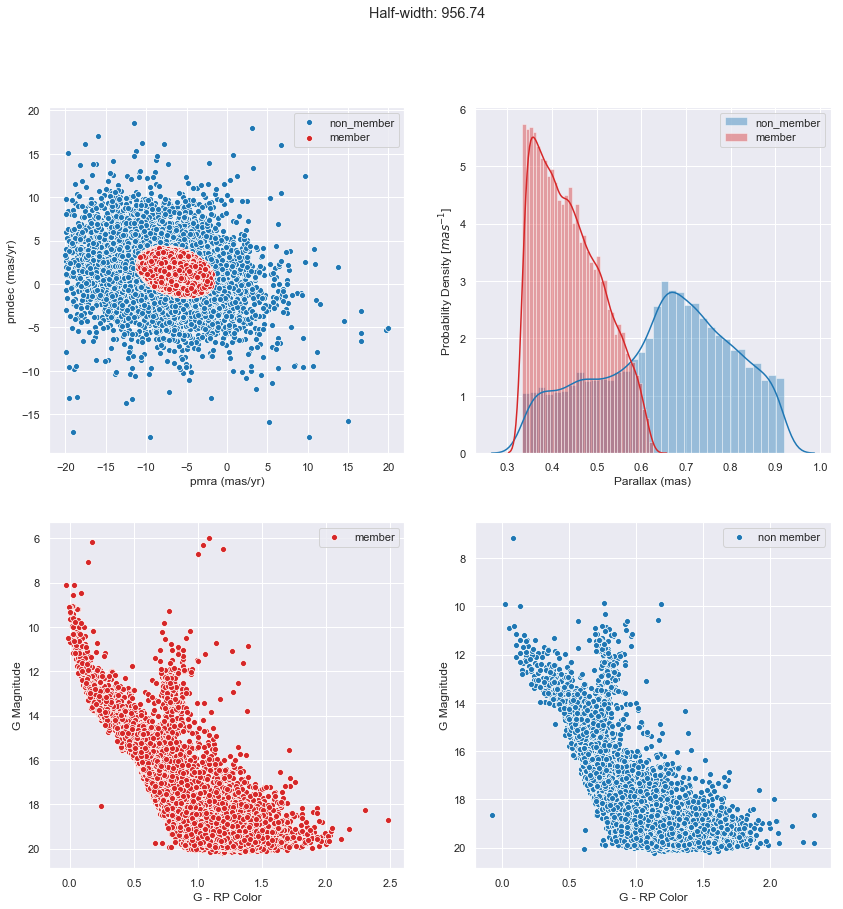

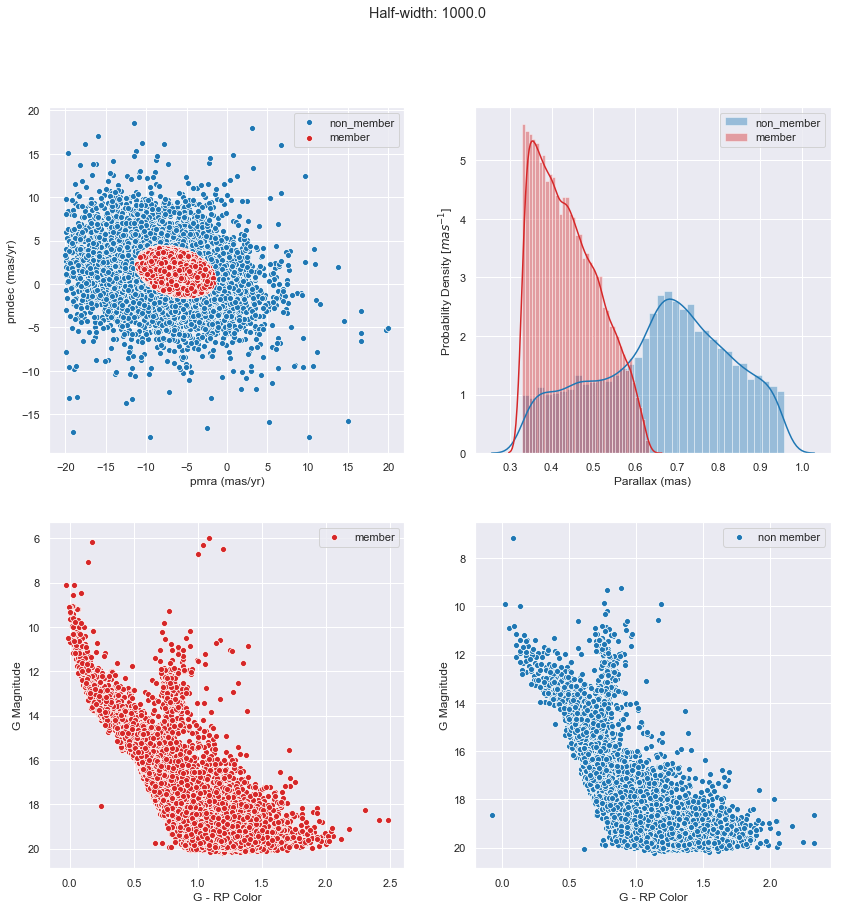

In [20]:
# distance of the cluster taken from Cantat-Gaudin (2020)
distance_literature = 2045

import warnings
warnings.filterwarnings('ignore')

metrics = np.full(len(widths), -1, dtype='float')
n_members = np.full(len(widths), -1, dtype='float')
std = np.full((len(widths), 4), -1, dtype='float')

n_trial = 15

for i in range(len(widths)):
    metric_value = 0
    std[i] = [0,0,0,0]
    n_member = 0

    for _ in range(n_trial):
        width = widths[i]
        filter = abs(all_stars.distance_pc - distance_literature) < width
        working_data = all_stars[filter]

        feature_columns = ['pmra', 'pmdec', 'parallax']
        
        member, non_member, gmm = get_member(working_data, feature_columns)

        n_member += len(member)
        metric_value += get_MSS_metric(member, non_member, feature_columns)
        std[i] += [np.std(member.pmra), np.std(member.pmdec), 
                   np.std(non_member.pmra), np.std(non_member.pmdec)]
    
    metrics[i] = metric_value/n_trial
    std[i] /= n_trial
    n_members[i] = n_member / n_trial
    visualize_member(member, non_member, title=f'Half-width: {width}')

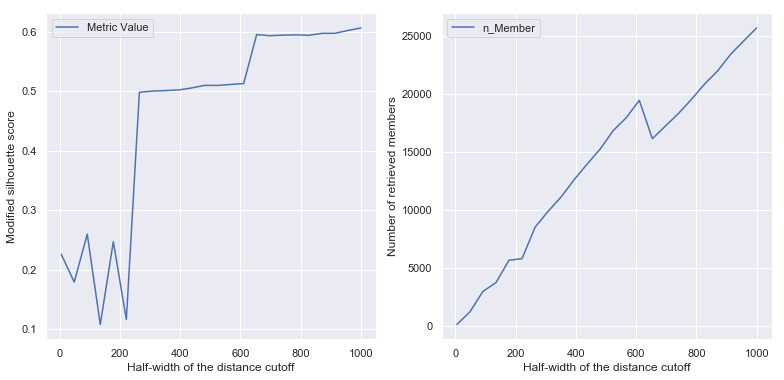

In [21]:
plt.figure(figsize = (13, 6))

plt.subplot(121)
sns.lineplot(widths, metrics, label = 'Metric Value')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Modified silhouette score')
plt.legend()

plt.subplot(122)
sns.lineplot(widths, n_members, label = 'n_Member')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Number of retrieved members')
plt.legend()
plt.show()

In [22]:
best_width = widths[np.nanargmax(metrics)]
best_width

1000.0

#### Member Cutoff

In [23]:
distance_literature = 2045
filter = abs(all_stars.distance_pc - distance_literature) < best_width
all_stars_filtered = all_stars.loc[filter, :]
len(all_stars_filtered)

44788

In [24]:
cutoffs = np.linspace(0.5, 0.95, 10)
MSS_metrics = []
n_members = []
for cutoff in cutoffs:
    member, non_member, gmm = get_member(all_stars_filtered, 
                                         feature_columns, cutoff=cutoff)
    MSS = get_MSS_metric(member, non_member, feature_columns)
    MSS_metrics.append(MSS)
    n_members.append(len(member))

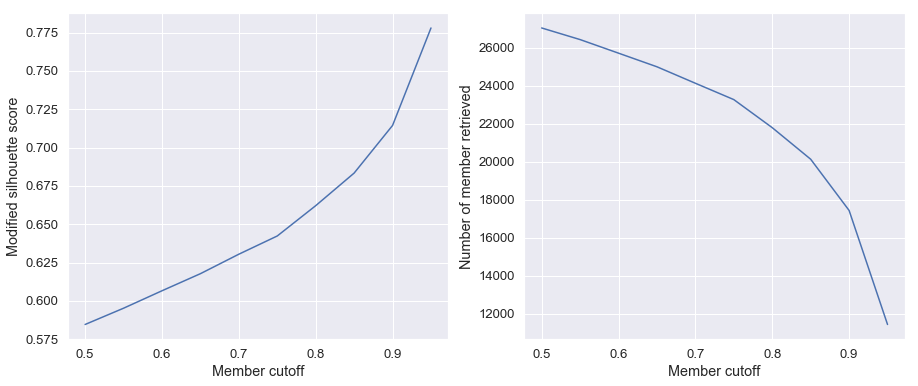

In [25]:
plt.figure(figsize = (15, 6))
sns.set(font_scale = 1.2)

plt.subplot(121)
sns.lineplot(cutoffs, MSS_metrics)
plt.xlabel('Member cutoff')
plt.ylabel('Modified silhouette score')

plt.subplot(122)
sns.lineplot(cutoffs, n_members)
plt.xlabel('Member cutoff')
plt.ylabel('Number of member retrieved')
plt.show()

In [26]:
best_cutoff = cutoffs[np.nanargmax(MSS_metrics)]
best_cutoff

0.95

### Building GMM Model

number of member: 11410,
 number of field star: 11337,
 MSS: 0.78


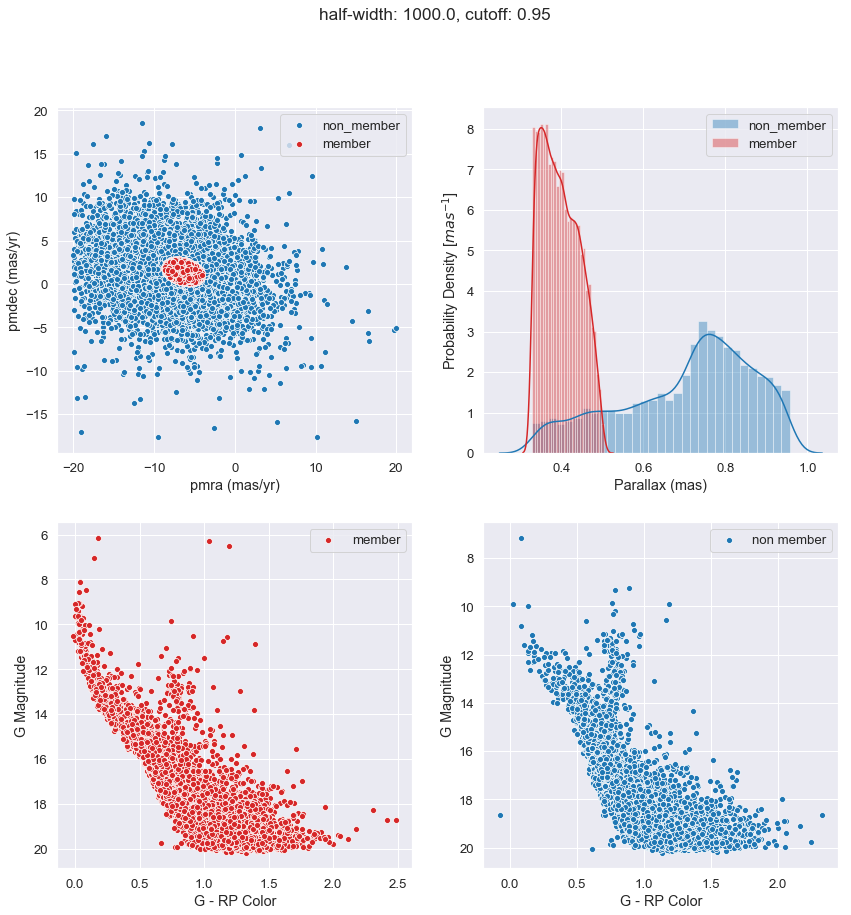

In [27]:
cutoff = best_cutoff

feature_columns = ['pmra', 'pmdec', 'parallax']

member, non_member, gmm = get_member(all_stars_filtered, feature_columns, 
                                     cutoff=cutoff, random_state = 42)

MSS = get_MSS_metric(member, non_member, feature_columns)
print(f'number of member: {len(member)},\n number of field star: {len(non_member)},\n MSS: {MSS:0.2f}') 

visualize_member(member, non_member, title=f'half-width: {width}, cutoff: {cutoff}')

### Comparing similar figures as Gao (2018) Paper

#### Members and Covariance Matrix

In [26]:
gmm.covariances_.round(3)

array([[[ 1.861, -0.461,  0.105],
        [-0.461,  1.968,  0.025],
        [ 0.105,  0.025,  1.099]],

       [[ 0.327, -0.091,  0.004],
        [-0.091,  0.283,  0.005],
        [ 0.004,  0.005,  0.289]]])

In [27]:
print('Number of sample stars:', len(all_stars_filtered))

Number of sample stars: 44788


In [31]:
print('n(PMemb >= 0.6) =', sum(all_stars_filtered.PMemb >= 0.6))
print('n(PMemb >= 0.95) =', sum(all_stars_filtered.PMemb >= 0.95))
print('n(PMemb <= 0.0001) =', sum(all_stars_filtered.PMemb <= 0.0001))

n(PMemb >= 0.6) = 25709
n(PMemb >= 0.95) = 11402
n(PMemb <= 0.0001) = 4853


#### Figure 1
PMemb histogram and the plot for PMemb vs G band magnitude.

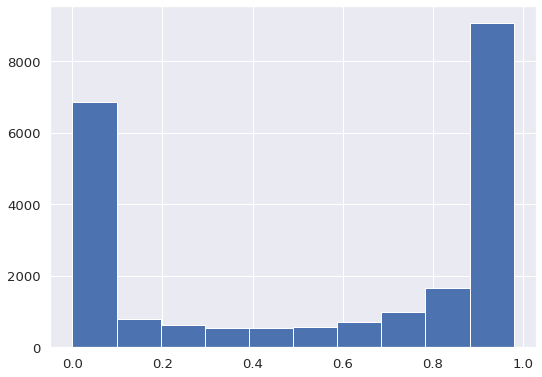

In [ ]:
plt.hist(all_stars_filtered.PMemb)
plt.show()

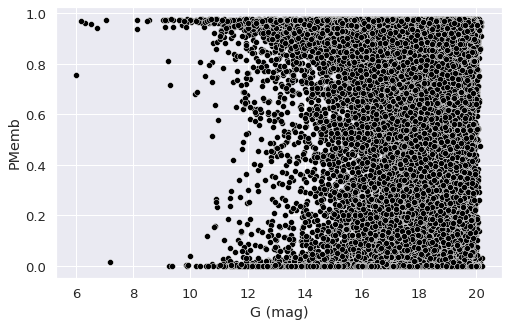

In [32]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = all_stars_filtered, color = 'black')
plt.xlabel('G (mag)')
plt.show()

#### Figure 2
Proper Motion Plot

In [33]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,...,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
5,1635721458409799680,Gaia DR2 5334208407944647936,5334208407944647936,348791697,2015.5,174.065468,0.146048,-61.617428,0.136304,0.356620,0.163459,2.181709,-5.621995,0.271462,0.763386,0.238080,0.251819,-0.346613,-0.559183,-0.320907,-0.030658,-0.237782,-0.500260,0.179717,0.368450,0.242178,168,0,168,0,3.191869,226.857483,0.393969,1.496308,31,False,0.935646,1.520399,0.036673,-0.093009,...,1.579121,0,1.104977,0.207626,0.897350,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,294.122742,-0.038166,212.814082,-55.765755,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.002552,0.002527,2804.104592,0.972430,0,1
6,1635721458409799680,Gaia DR2 5334208407957823232,5334208407957823232,685551234,2015.5,174.055930,0.021324,-61.614974,0.018764,0.473014,0.024474,19.327164,-6.726351,0.038474,1.033300,0.035578,0.043981,-0.075756,-0.507709,-0.029514,0.182270,0.024306,-0.370271,0.166975,0.331387,0.102019,197,0,196,1,-4.006158,122.416283,0.000000,0.000000,31,False,95.993065,1.669293,0.004383,-0.022283,...,1.192680,0,0.470044,0.166217,0.303827,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,294.117694,-0.037114,212.805283,-55.767199,100001,7784.0,7454.000000,8041.00,NaN,NaN,NaN,NaN,NaN,NaN,200111,2.014585,1.887866,2.196911,13.423856,11.646379,15.201332,https://gea.esac.esa.int/data-server/datalink/...,0.002628,0.000291,2114.104432,0.960566,0,1
14,1635721458409799680,Gaia DR2 5334208407957628544,5334208407957628544,1203797961,2015.5,174.062692,0.036982,-61.619452,0.033673,0.465970,0.043094,10.812881,-6.150827,0.076048,0.955737,0.070417,0.100418,-0.033051,-0.389977,0.022140,0.177324,0.074379,-0.050495,0.199311,0.120423,0.184045,199,0,195,4,13.697528,600.190369,0.265227,11.954387,31,False,10.689455,1.693740,0.008596,0.039011,...,1.332163,0,0.498593,0.059717,0.438876,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,294.122058,-0.040483,212.814944,-55.768122,102001,6876.0,6299.700195,8677.75,NaN,NaN,NaN,NaN,NaN,NaN,200111,1.939063,1.217445,2.310063,7.572199,5.996381,9.148018,https://gea.esac.esa.int/data-server/datalink/...,0.003540,0.000669,2146.060292,0.963879,0,1
21,1635721458409799680,Gaia DR2 5334208407957797120,5334208407957797120,1462919753,2015.5,174.067849,0.040567,-61.618733,0.044320,0.401176,0.047923,8.371324,-6.811881,0.070323,0.806354,0.078850,0.023981,-0.312429,-0.564358,-0.167868,0.120978,-0.059390,-0.604405,0.275903,0.279363,0.171062,151,151,151,0,4.612320,238.921371,0.000000,0.000000,31,False,316.529022,1.750545,0.009926,0.140734,...,1.191845,0,0.140621,0.023656,0.116965,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,294.124200,-0.039091,212.817143,-55.765887,102001,9631.0,9254.000000,9773.75,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.004243,0

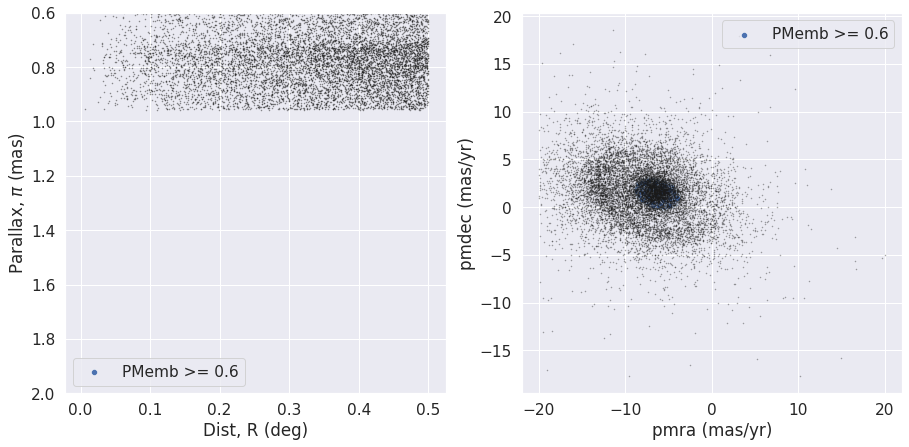

In [34]:
sns.set(font_scale = 1.4)

plt.figure(figsize = (15,7))

plt.subplot(121)
plt.plot(non_member['dist'], non_member['parallax'], 'k.',  alpha = 0.5,
         markersize = 1)
plt.gca().invert_yaxis()
sns.scatterplot('dist', 'parallax', data = member, label = 'PMemb >= 0.6')
plt.xlabel('Dist, R (deg)')
plt.ylabel('Parallax, $\pi$ (mas)')
plt.legend()
plt.ylim(2,0.6)

plt.subplot(122)
plt.plot(non_member['pmra'], non_member['pmdec'], 'k.', alpha = 0.4, 
         markersize = 1)
sns.scatterplot('pmra', 'pmdec', data = member, label = 'PMemb >= 0.6')
plt.ylabel('pmdec (mas/yr)')
plt.xlabel('pmra (mas/yr)')
plt.legend()
plt.show()

#### Figure 3: CMD
Color-Magnitude Diagram

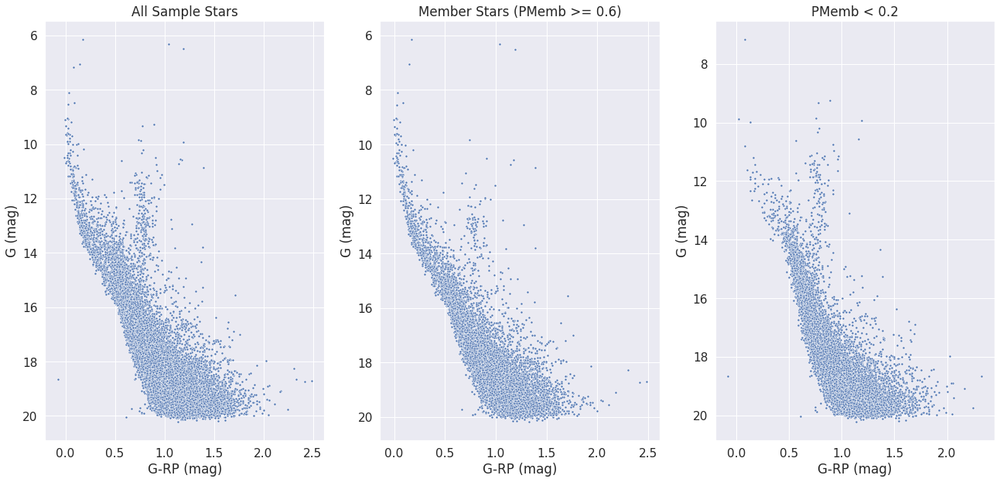

In [35]:
fig, axes = plt.subplots(1, 3, figsize=(22,10))
#fig.suptitle('CMD of Training data for M67')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = training_data, ax = axes[0], marker = '.')
axes[0].set_title('All Sample Stars')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = '.',
                data = member, ax = axes[1])
axes[1].set_title('Member Stars (PMemb >= 0.6)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',  marker = '.',
                data = non_member[non_member.PMemb < 0.2], ax = axes[2])
axes[2].set_title('PMemb < 0.2')
axes[2].invert_yaxis()
axes[2].set_xlabel('G-RP (mag)')
axes[2].set_ylabel('G (mag)')

plt.show()


#### Distribution of features

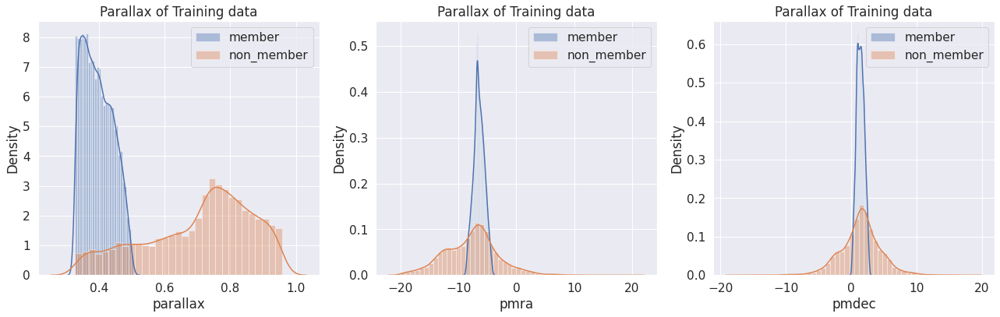

In [36]:
plt.figure(figsize = (22,6))

plt.subplot(131)
sns.distplot(member.parallax, label='member')
sns.distplot(non_member.parallax, label = 'non_member')
plt.title('Parallax of Training data')
plt.legend()

plt.subplot(132)
sns.distplot(member.pmra, label='member')
sns.distplot(non_member.pmra, label = 'non_member')
plt.title('Parallax of Training data')
plt.legend()

plt.subplot(133)
sns.distplot(member.pmdec, label='member')
sns.distplot(non_member.pmdec, label = 'non_member')
plt.title('Parallax of Training data')
plt.legend()

plt.show()

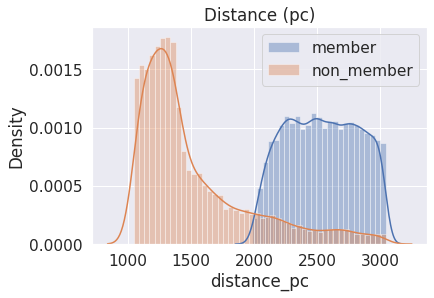

In [37]:
sns.distplot(member.distance_pc, label='member')
sns.distplot(non_member.distance_pc, label = 'non_member')
plt.title('Distance (pc)')
plt.legend()
plt.show()

### Random Forest

In [28]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
5,1635721458409799680,b'Gaia DR2 5334208407944647936',5334208407944647936,348791697,2015.5,174.065468,0.146048,-61.617428,0.136304,0.356620,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.002552,0.002527,2804.104592,0.972443,0,1
6,1635721458409799680,b'Gaia DR2 5334208407957823232',5334208407957823232,685551234,2015.5,174.055930,0.021324,-61.614974,0.018764,0.473014,...,13.423856,11.646379,15.201332,b'https://gea.esac.esa.int/data-server/datalin...,0.002628,0.000291,2114.104432,0.960590,0,1
14,1635721458409799680,b'Gaia DR2 5334208407957628544',5334208407957628544,1203797961,2015.5,174.062692,0.036982,-61.619452,0.033673,0.465970,...,7.572199,5.996381,9.148018,b'https://gea.esac.esa.int/data-server/datalin...,0.003540,0.000669,2146.060292,0.963899,0,1
21,1635721458409799680,b'Gaia DR2 5334208407957797120',5334208407957797120,1462919753,2015.5,174.067849,0.040567,-61.618733,0.044320,0.401176,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.004243,0.000311,2492.670568,0.970639,0,1
24,1635721458409799680,b'Gaia DR2 5334208403634203136',5334208403634203136,916084775,2015.5,174.063172,0.043489,-61.620707,0.035979,0.447387,...,1.933437,1.465721,2.401152,b'https://gea.esac.esa.int/data-server/datalin...,0.004815,0.001198,2235.200283,0.970225,0,1


In [29]:
# Examining the descriptive statistics of each column
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
count,2.274700e+04,2.274700e+04,2.274700e+04,22747.0,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,...,4405.000000,4405.000000,4405.000000,4405.000000,22747.000000,22747.000000,22747.000000,2.274700e+04,22747.000000,22747.000000
mean,1.635721e+18,5.334886e+18,8.407660e+08,2015.5,174.068494,0.154988,-61.577151,0.149620,0.551138,0.191192,...,2.568536,19.318430,16.590794,22.046078,0.326821,0.002164,2030.826781,4.880790e-01,0.498395,0.501605
std,0.000000e+00,7.483112e+14,4.868239e+08,0.0,0.518005,0.107239,0.244151,0.102962,0.193379,0.131938,...,8.488858,500.808868,429.699097,572.123779,0.122519,0.001381,633.760340,4.805279e-01,0.500008,0.500008
min,1.635721e+18,5.334122e+18,1.649190e+05,2015.5,173.011337,0.011986,-62.115820,0.012567,0.328414,0.014914,...,0.607411,0.164763,0.138401,0.191126,0.002552,0.000125,1045.030309,1.561171e-102,0.000000,0.000000
25%,1.635721e+18,5.334192e+18,4.204925e+08,2015.5,173.657834,0.059898,-61.765763,0.057962,0.386801,0.072773,...,1.264615,0.841611,0.684792,1.003549,0.238227,0.000922,1353.904988,3.056170e-04,0.000000,0.000000
50%,1.635721e+18,5.334226e+18,8.414259e+08,2015.5,174.074181,0.135901,-61.566028,0.131441,0.461179,0.170004,...,1.728628,1.909776,1.530090,2.247401,0.348995,0.001973,2168.356251,9.502269e-01,0.000000,1.000000
75%,1.635721e+18,5.335673e+18,1.256557e+09,2015.5,174.475102,0.235724,-61.380362,0.226767,0.738604,0.290652,...,2.272687,4.133499,3.449426,4.852247,0.430947,0.003268,2585.310088,9.685007e-01,1.000000,1.000000
max,1.635721e+18,5.335746e+18,1.692908e+09,2015.5,175.109076,0.641819,-61.116834,0.695099,0.956910,1.393938,...,375.893005,20587.173828,17258.289062,23916.058594,0.500000,0.005000,3044.934991,9.784195e-01,1.000000,1.000000


In [43]:
# Choosing the features

feature_columns = np.array(['pmra', 'pmdec',
                   'parallax', 'phot_g_mean_mag',
                   "phot_bp_mean_mag", 'phot_rp_mean_mag',
                   'bp_rp', 'bp_g', 'g_rp'])

features = training_data.loc[:,feature_columns]
targets = training_data['member']

In [31]:
# Dropping the NULL values from the using training set
# adding features and targets in a training set
training_set = pd.concat((features, targets), axis=1)

# dropping NA
training_set = training_set.dropna()

# finding where dtype is float64
float64_data = np.where(training_set.dtypes == 'float64')[0] 

# change the data type to float32 from float64
training_set.iloc[:, float64_data] = training_set.iloc[:, float64_data].astype('float32')


# set features, targets again
features, targets = training_set.iloc[:,:-1], training_set.iloc[:,-1]

features.describe()

,pmra,pmdec,parallax,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,bp_rp,bp_g,g_rp
count,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000,22747.000000
mean,-7.099114,1.443303,0.551138,17.856520,18.388950,16.908855,1.480101,0.532422,0.947676
std,3.380459,2.246986,0.193379,1.774010,1.857197,1.550198,0.450741,0.281645,0.292576
min,-19.989988,-17.682262,0.328414,6.157246,6.276869,5.264738,-0.371742,-1.208666,-0.077898
25%,-7.964132,0.779171,0.386801,16.940205,17.455640,16.162745,1.211752,0.392884,0.741165
50%,-6.670932,1.451778,0.461179,18.355364,18.954538,17.343874,1.470221,0.514833,0.958885
75%,-5.613803,2.180906,0.738604,19.210525,19.757788,18.057178,1.731395,0.670458,1.139993
max,19.982573,18.556400,0.956910,20.205086,21.713451,19.433550,5.517056,3.756779,2.486805


In [32]:
targets.value_counts()

1    11410
0    11337
Name: member, dtype: int64

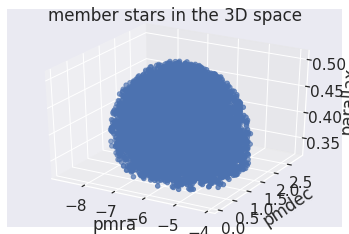

In [43]:
from mpl_toolkits.mplot3d import Axes3D


ax = plt.figure().gca(projection='3d')

ax.scatter(member.pmra, member.pmdec, member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('member stars in the 3D space')
plt.show()


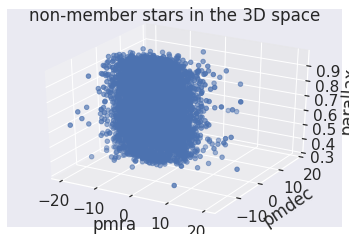

In [44]:
ax = plt.figure().gca(projection='3d')

ax.scatter(non_member.pmra, non_member.pmdec, non_member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('non-member stars in the 3D space')
plt.show()


### Feature Importance

#### Mean Decrease in Impurity (MDI)

In [34]:
# Use Random Forest on whole dataset using 1000 different trees 
rfc = RandomForestClassifier(n_estimators = 1000, oob_score = True)
rfc.fit(features, targets)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [46]:
# checking the feature importance, 
# ( this is higher for a variable if the model efficiency become lower as we remove that variable)
feature_imp = pd.Series(rfc.feature_importances_, index=features.columns).sort_values(ascending = False)
feature_imp

parallax            0.613681
pmra                0.191762
pmdec               0.170398
phot_g_mean_mag     0.006494
phot_rp_mean_mag    0.005581
g_rp                0.004911
bp_rp               0.003811
phot_bp_mean_mag    0.001864
bp_g                0.001499
dtype: float64

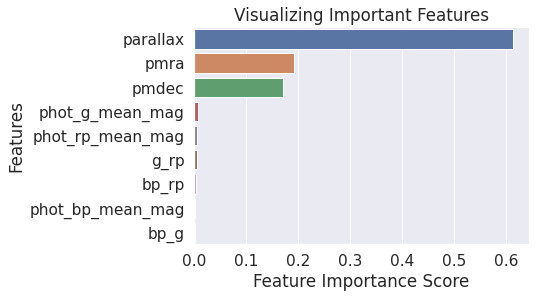

In [47]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

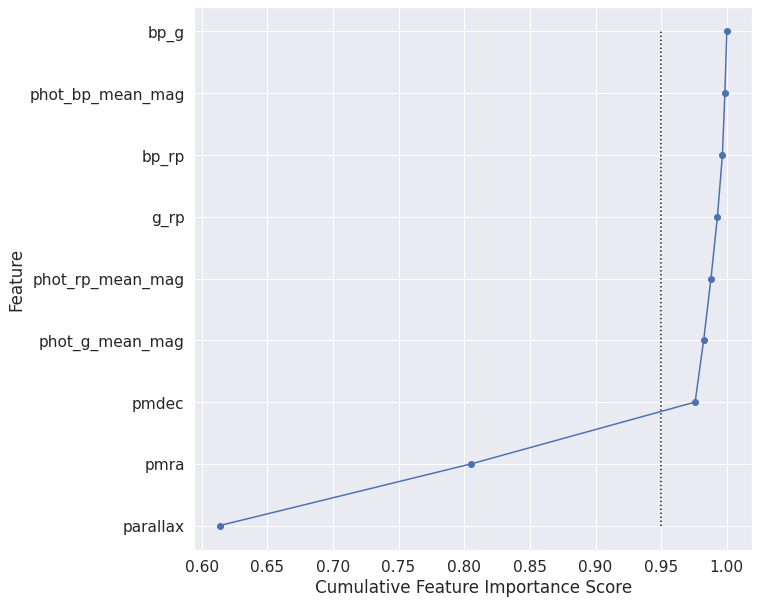

In [48]:
#evaluate the cumulative
plt.figure(figsize=(10,10))
cumulative = np.cumsum(feature_imp)
plt.plot(cumulative, feature_imp.index, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score')
plt.show()

In [50]:
cumulativemax_index = np.where(cumulative > 0.95)[0][0]
max_index

NameError: ignored

In [51]:
imp_feature_columns = feature_imp.index[:max_index+1]
imp_feature_columns

NameError: ignored

#### SHAP feature importance

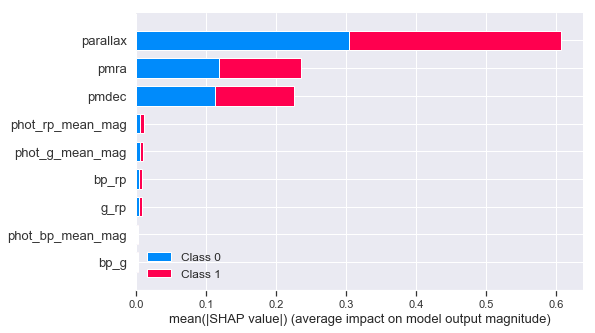

In [36]:
import shap
rfc = RandomForestClassifier(n_estimators = 1000, oob_score = True)
rfc.fit(features, targets)

shap_values = shap.TreeExplainer(rfc).shap_values(features)
shap.summary_plot(shap_values, features)

In [38]:
shap_values = np.array(shap_values)
len(features), len(shap_values[0])

(22747, 22747)

In [39]:
# mean of absolute SHAP values for class 1 (member)
feature_imp_member = abs(shap_values[1,:,:]).mean(axis=0)
# mean of absolute SHAP values for class 0 (non_member)
feature_imp_non_member = abs(shap_values[1,:,:]).mean(axis=0)

In [40]:
# overall feature imp
feature_imp = feature_imp_member+feature_imp_non_member
#normalizing
feature_imp /= feature_imp.sum()

In [41]:
sorted_order = feature_imp.argsort()[::-1]
sorted_feature_imp = feature_imp[sorted_order]

In [44]:
sorted_feature_columns = feature_columns[sorted_order]

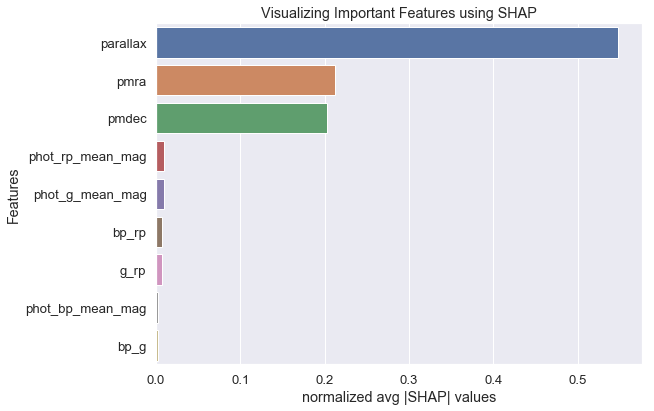

In [45]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=sorted_feature_imp, 
            y=sorted_feature_columns)
# Add labels to the graph
plt.xlabel('normalized avg |SHAP| values')
plt.ylabel('Features')
plt.title("Visualizing Important Features using SHAP")
plt.show()

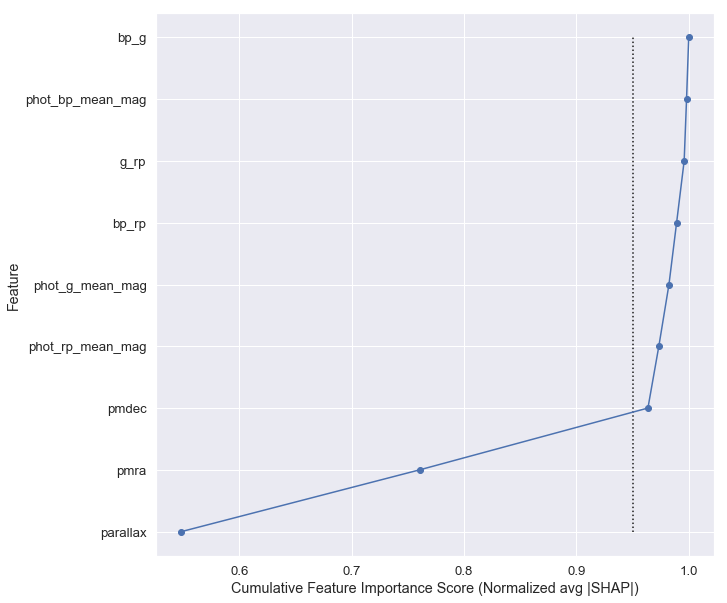

In [46]:
#evaluate the cumulative
plt.figure(figsize=(10,10))
cumulative = np.cumsum(sorted_feature_imp)
plt.plot(cumulative, sorted_feature_columns, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score (Normalized avg |SHAP|)')
plt.show()

In [47]:
max_index = np.where(cumulative > 0.95)[0][0]
max_index

2

In [48]:
imp_feature_columns = sorted_feature_columns[:max_index+1]
imp_feature_columns 

array(['parallax', 'pmra', 'pmdec'], dtype='<U16')

### Model Selection and Accuracy Estimate using Test Data

In [49]:
features = training_data.loc[:,imp_feature_columns]
targets = training_data['member']

features.head()

,parallax,pmra,pmdec
5,0.356620,-5.621995,0.763386
6,0.473014,-6.726351,1.033300
14,0.465970,-6.150827,0.955737
21,0.401176,-6.811881,0.806354
24,0.447387,-6.697938,1.183921


In [50]:
from sklearn.model_selection import train_test_split
# splitting our dataset using 0.3 test ratio (30% test data, 70% train data)
train_features, test_features, train_targets, test_targets = train_test_split(features,
                                                                              targets,
                                                                              test_size = 0.3, 
                                                                              stratify = targets,
                                                                              random_state=258)

In [51]:
# testing if the splited data have similar percentage of member and non-member

print(f'Propostion of class:\n \
 original target data:\n{targets.value_counts()/len(targets)} \n\
 test_targets: \n{test_targets.value_counts()/len(test_targets)} \n\
 train_targets: \n{train_targets.value_counts()/len(train_targets)}')

Propostion of class:
  original target data:
1    0.501605
0    0.498395
Name: member, dtype: float64 
 test_targets: 
1    0.501538
0    0.498462
Name: member, dtype: float64 
 train_targets: 
1    0.501633
0    0.498367
Name: member, dtype: float64


In [52]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, classification_report

In [53]:
def evaluate_model(model):
    test_predict = model.predict(test_features)
    train_predict = model.predict(train_features)

    print('Model Accuracy:')
    print("Precision on training data: %.3f" % precision_score(train_targets, train_predict))
    print("Precision on testing data: %.3f" % precision_score(test_targets, test_predict))
    print('Accuracy on test data: %.3f' % accuracy_score(test_targets, test_predict))


    sns.heatmap(confusion_matrix(test_targets, test_predict), cmap= 'Greens', annot = True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

    print("Classification Report: \n", classification_report(test_targets, test_predict))

#### Random Forest Hyperparameter Tuning

We will optimize the parameteres of random forest model using cross-validation.

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


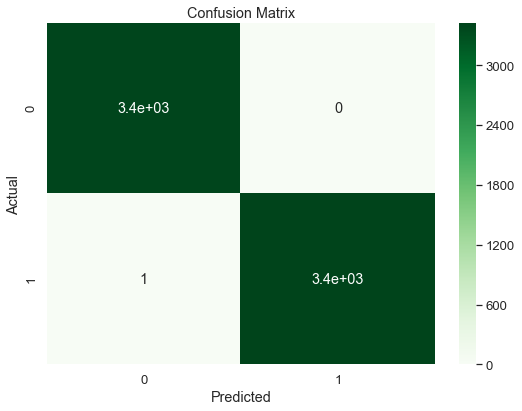

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3402
           1       1.00      1.00      1.00      3423

   micro avg       1.00      1.00      1.00      6825
   macro avg       1.00      1.00      1.00      6825
weighted avg       1.00      1.00      1.00      6825



In [54]:
base_model = RandomForestClassifier(random_state = 42)
base_model.fit(train_features, train_targets)

evaluate_model(base_model)


In [56]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 500, stop = 10000, num = 20)]
max_features = ['sqrt']+[i for i in range(1, len(features.columns)+1)]
# Maximum number of levels
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

random_grid

{'n_estimators': [500,
  1000,
  1500,
  2000,
  2500,
  3000,
  3500,
  4000,
  4500,
  5000,
  5500,
  6000,
  6500,
  7000,
  7500,
  8000,
  8500,
  9000,
  9500,
  10000],
 'max_features': ['sqrt', 1, 2, 3],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4],
 'bootstrap': [True, False]}

In [57]:
rfc = RandomForestClassifier(random_state = 42)

rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, 
                               n_iter = 50, cv = 5, verbose=10, random_state=42, n_jobs = -1,
                               scoring = 'precision')

In [58]:
rfc_random.fit(train_features, train_targets)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed: 17.9min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed: 24.9min
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed: 28.1min
[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed: 57.1min
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed: 63.7min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed: 75.3min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 84.1min
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed: 10

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=50, n_jobs=-1,
          param_distributions={'n_estimators': [500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000], 'max_features': ['sqrt', 1, 2, 3], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_t

In [59]:
rfc_random.best_params_


{'n_estimators': 500,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 20,
 'bootstrap': True}

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


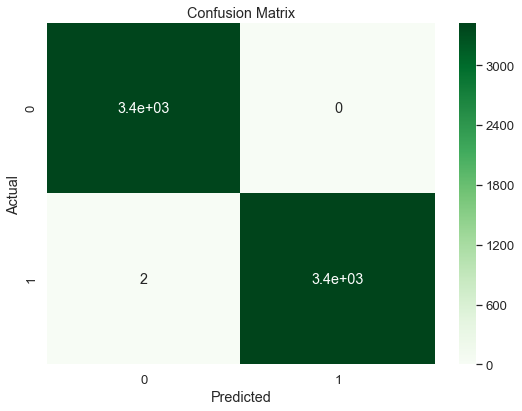

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3402
           1       1.00      1.00      1.00      3423

   micro avg       1.00      1.00      1.00      6825
   macro avg       1.00      1.00      1.00      6825
weighted avg       1.00      1.00      1.00      6825



In [60]:
best_random = rfc_random.best_estimator_

evaluate_model(best_random)


### Prediction for the new stars

In [62]:
## take all the stars in a 1 degree search radius

GAIA_target_stars = r.to_pandas()

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars['parallax'] >= 0]

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars.loc[:, 'bp_rp'].notnull()]

GAIA_target_stars.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist
count,5.483120e+05,5.483120e+05,5.483120e+05,548312.0,548312.000000,548312.000000,548312.000000,548312.000000,548312.000000,548312.000000,...,43108.000000,43108.000000,41325.0,41325.000000,41325.000000,41325.000000,41325.000000,41325.000000,41325.000000,548312.000000
mean,1.635721e+18,5.334996e+18,8.471524e+08,2015.5,174.065258,0.326285,-61.447690,0.296167,0.589556,0.383313,...,0.469190,0.744690,200111.0,3.148640,2.816308,3.401356,15.139841,12.527720,17.752190,0.660469
std,0.000000e+00,7.348464e+14,4.884681e+08,0.0,1.059910,0.342712,0.458883,0.295836,0.686677,0.371651,...,0.350295,0.370513,0.0,6.355064,5.723220,6.950916,313.504547,255.579468,372.645813,0.239486
min,1.635721e+18,5.333350e+18,4.530000e+03,2015.5,171.957245,0.011657,-62.615176,0.011472,0.000001,0.014271,...,0.000000,0.016100,200111.0,0.500558,0.331566,0.517189,0.035314,0.034275,0.036353,0.001139
25%,1.635721e+18,5.334229e+18,4.250974e+08,2015.5,173.200260,0.092796,-61.777843,0.088240,0.213686,0.114274,...,0.203600,0.443000,200111.0,1.206994,1.099358,1.288006,0.859290,0.692025,1.019671,0.492763
50%,1.635721e+18,5.334929e+18,8.478855e+08,2015.5,174.062096,0.212558,-61.415422,0.199730,0.395309,0.263456,...,0.355000,0.671200,200111.0,1.693622,1.540176,1.832072,2.080150,1.694471,2.454635,0.698222
75%,1.635721e+18,5.335727e+18,1.269949e+09,2015.5,174.919107,0.434227,-61.073640,0.401910,0.704952,0.530165,...,0.681900,1.031350,200111.0,2.566154,2.332525,2.784959,5.823964,4.807588,6.835938,0.864172
max,1.635721e+18,5.335959e+18,1.692917e+09,2015.5,176.164871,3.519415,-60.616334,3.090299,20.386436,4.694548,...,1.572900,1.788000,200111.0,342.377197,314.299286,375.893005,43368.144531,32627.091797,54109.195312,0.999999


In [63]:
# noise filter
GAIA_target_stars['g_mag_error'] = 2.5/np.log(10) / GAIA_target_stars.phot_g_mean_flux_over_error
mask = GAIA_target_stars.g_mag_error < 0.005

# distance filter
GAIA_target_stars['distance_pc'] = 1/(GAIA_target_stars.parallax*0.001)
dist_filter = abs(GAIA_target_stars.distance_pc - distance_literature) < best_width

# proper motion filter
pm_filter = (abs(GAIA_target_stars['pmra']) < 20) & (abs(GAIA_target_stars['pmdec']) < 20)

GAIA_target_stars = GAIA_target_stars.loc[mask & pm_filter & dist_filter, :]

In [64]:
GAIA_target_stars = GAIA_target_stars.dropna(subset = feature_columns)
len(GAIA_target_stars)

171025

In [65]:
# select the set of predictor variables from the new dataset
new_features = GAIA_target_stars.loc[:, imp_feature_columns]
new_features = new_features.astype('float32')

In [ ]:
# train the model again using all the features and targets of the previous dataset
# rfc.fit(features, targets)

In [67]:
base_model = RandomForestClassifier(n_estimators = 7000,
                                    oob_score = True)
base_model.fit(features, targets)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=7000, n_jobs=None,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [68]:
base_model.oob_score_

0.9999560381588781

In [69]:
# estimate the membership classification of the stars
GAIA_target_stars['member'] = base_model.predict(new_features)
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = base_model.predict_proba(new_features)[:,1]
GAIA_target_stars['member'].value_counts()

0    116685
1     54340
Name: member, dtype: int64

In [70]:
print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))

n(PMemb >= 0.6) = 53098
n(PMemb >= 0.8) = 50529


In [71]:
best_random = rfc_random.best_estimator_
best_random.fit(train_features, train_targets)

# estimate the membership classification of the stars
GAIA_target_stars['member'] = best_random.predict(new_features)
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = best_random.predict_proba(new_features)[:,1]

print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))
GAIA_target_stars['member'].value_counts()

n(PMemb >= 0.6) = 52729
n(PMemb >= 0.8) = 49786


0    117089
1     53936
Name: member, dtype: int64

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


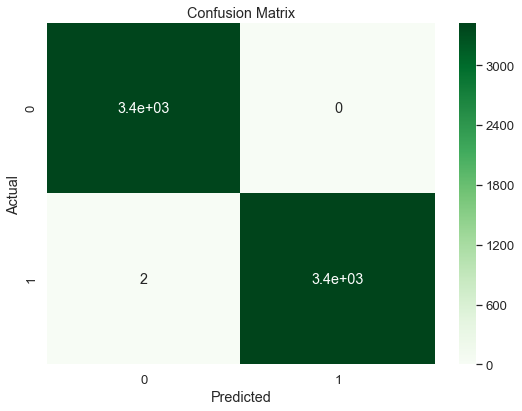

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3402
           1       1.00      1.00      1.00      3423

   micro avg       1.00      1.00      1.00      6825
   macro avg       1.00      1.00      1.00      6825
weighted avg       1.00      1.00      1.00      6825



In [72]:
evaluate_model(best_random)

In [83]:
potentialMember = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 1]
len(potentialMember)

7640

In [82]:
print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))
print('n(PMemb == 1) =', sum(GAIA_target_stars['PMemb'] == 1))

n(PMemb >= 0.6) = 52729
n(PMemb >= 0.8) = 49786
n(PMemb == 1) = 7640


In [75]:
potentialMember.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,member,PMemb
count,5.272900e+04,5.272900e+04,5.272900e+04,52729.0,52729.000000,52729.000000,52729.000000,52729.000000,52729.000000,52729.000000,...,8571.000000,8571.000000,8571.000000,8571.000000,8571.000000,52729.000000,52729.000000,52729.000000,52729.0,52729.000000
mean,1.635721e+18,5.334958e+18,8.494699e+08,2015.5,174.052587,0.144158,-61.473157,0.135872,0.404793,0.178563,...,2.666810,3.187379,19.265709,16.512241,22.019140,0.652594,0.002030,2506.386997,1.0,0.969343
std,0.000000e+00,7.341176e+14,4.881771e+08,0.0,1.063201,0.098612,0.456471,0.091442,0.048935,0.121550,...,6.674268,7.907379,403.543030,349.623322,457.728668,0.242982,0.001275,299.512933,0.0,0.073428
min,1.635721e+18,5.333350e+18,1.203830e+05,2015.5,171.958906,0.012198,-62.613339,0.011472,0.328408,0.014481,...,0.533289,0.967975,0.499047,0.349797,0.635804,0.001139,0.000119,1982.560895,1.0,0.600113
25%,1.635721e+18,5.334221e+18,4.269933e+08,2015.5,173.186180,0.061307,-61.799488,0.058066,0.362230,0.074784,...,1.428357,1.707568,1.745162,1.338237,2.150823,0.484809,0.000945,2249.090195,1.0,0.990045
50%,1.635721e+18,5.334916e+18,8.524407e+08,2015.5,174.046624,0.124943,-61.442362,0.118708,0.399998,0.156730,...,1.725304,2.063664,3.043514,2.412988,3.682766,0.688135,0.001825,2500.014810,1.0,0.998613
75%,1.635721e+18,5.335718e+18,1.271254e+09,2015.5,174.905052,0.210784,-61.108510,0.198341,0.444624,0.261302,...,2.255314,2.708326,6.337544,5.242022,7.380800,0.859589,0.002949,2760.676627,1.0,0.999978
max,1.635721e+18,5.335957e+18,1.692908e+09,2015.5,176.161516,0.842444,-60.616453,0.651022,0.504398,0.962398,...,314.299286,375.893005,20587.173828,17258.289062,23916.058594,0.999983,0.005000,3044.995430,1.0,1.000000


In [ ]:
member.describe()

#### Figure 4
PMemb from RF as a function of G band Magnitude and distance from cluster center.

PMemb $\geq$ 0.9 are colored in blue.

In [125]:
sns.set(font_scale= 1.4)

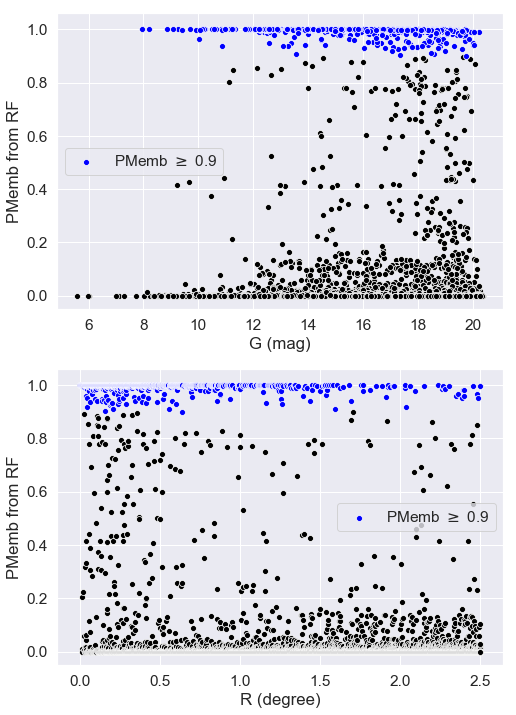

In [126]:
plt.figure(figsize = (8, 12))

PMemb_mask = GAIA_target_stars.PMemb >= 0.9
plt.subplot(211)
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('G (mag)')
plt.ylabel('PMemb from RF')
#plt.title('Member')

plt.subplot(212)
sns.scatterplot(x='dist', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='dist', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('R (degree)')
plt.ylabel('PMemb from RF')
plt.legend()
plt.show()

#### Figure 7: CMD

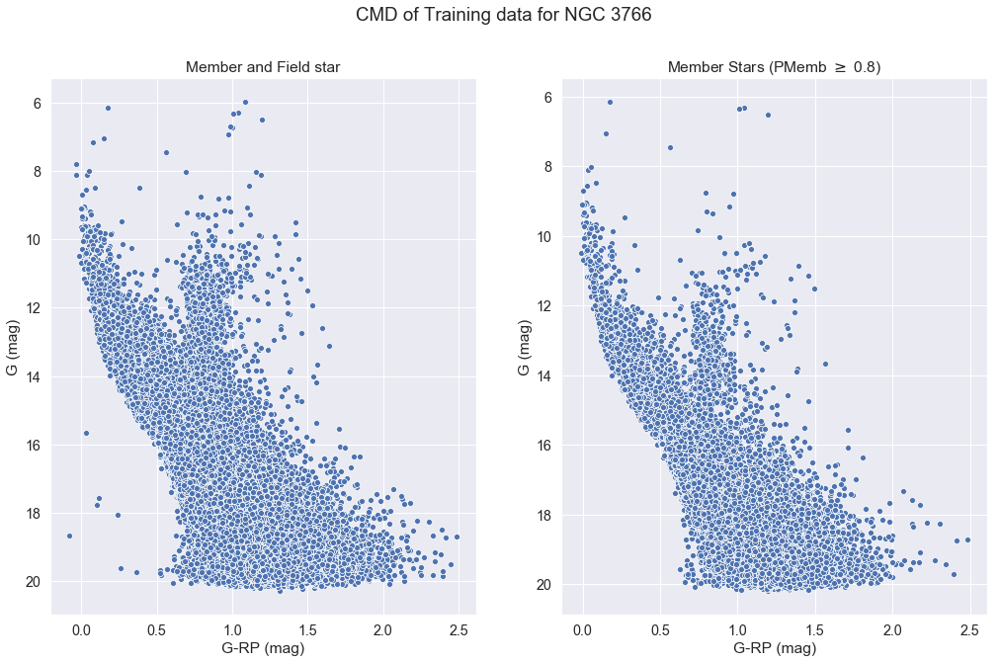

In [96]:
fig, axes = plt.subplots(1, 2, figsize=(17,10))
fig.suptitle('CMD of Training data for NGC 3766')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = GAIA_target_stars, ax = axes[0], marker = 'o')
axes[0].set_title('Member and Field star')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

PMemb_mask = GAIA_target_stars.PMemb >= 0.8

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = 'o',
                data = GAIA_target_stars[PMemb_mask], ax = axes[1])
axes[1].set_title('Member Stars (PMemb $\geq$ 0.8)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

plt.show()


In [ ]:
len(GAIA_target_stars[PMemb_mask])

26058

#### Figure 8
Comparison between GMM and RF membership probabilities

In [77]:
all_stars_feature = all_stars_filtered.loc[:, imp_feature_columns]
all_stars_filtered['PMemb_RF'] = best_random.predict_proba(all_stars_feature)[:,1]

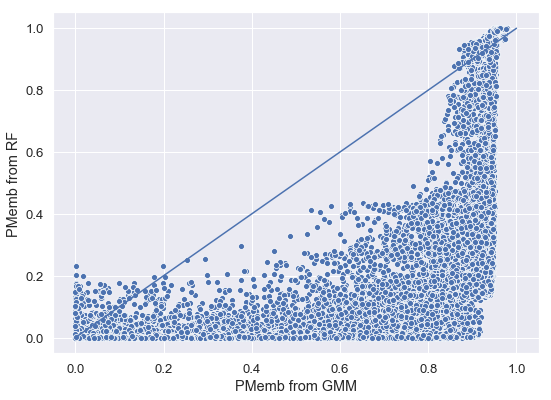

In [78]:
sns.scatterplot(x = 'PMemb', y = 'PMemb_RF', data = all_stars_filtered)
plt.ylabel('PMemb from RF')
plt.xlabel('PMemb from GMM')
plt.plot([0,1],[0,1])
plt.show()

### Distribution of the paramters

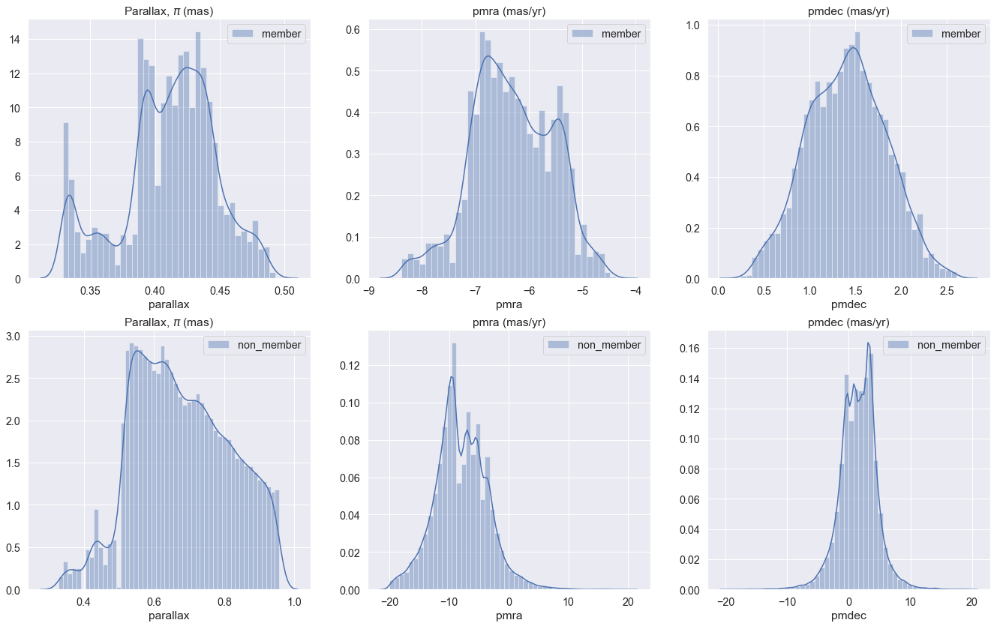

In [118]:
sns.set(font_scale=1.3)
plt.figure(figsize = (23,14))

member_mask = GAIA_target_stars.PMemb == 1
field_mask = GAIA_target_stars.PMemb == 0
potentialMember = GAIA_target_stars[member_mask]
potential_non_member = GAIA_target_stars[field_mask]


plt.subplot(231)
sns.distplot(member.parallax, label='member')
plt.title('Parallax, $\pi$ (mas)')
plt.legend()

plt.subplot(234)
sns.distplot(non_member.parallax, label = 'non_member')
plt.title('Parallax, $\pi$ (mas)')
plt.legend()

plt.subplot(232)
sns.distplot(member.pmra, label='member')
plt.title('pmra (mas/yr)')
plt.legend()

plt.subplot(235)
sns.distplot(non_member.pmra, label = 'non_member')
plt.title('pmra (mas/yr)')
plt.legend()

plt.subplot(233)
sns.distplot(member.pmdec, label='member')
plt.title('pmdec (mas/yr)')
plt.legend()

plt.subplot(236)
sns.distplot(non_member.pmdec, label = 'non_member')
plt.title('pmdec (mas/yr)')
plt.legend()

plt.show()

### Other visualizations

In [123]:
member_mask = GAIA_target_stars.PMemb == 1
field_mask = GAIA_target_stars.PMemb == 0
potentialMember = GAIA_target_stars[member_mask]
potential_non_member = GAIA_target_stars[field_mask]

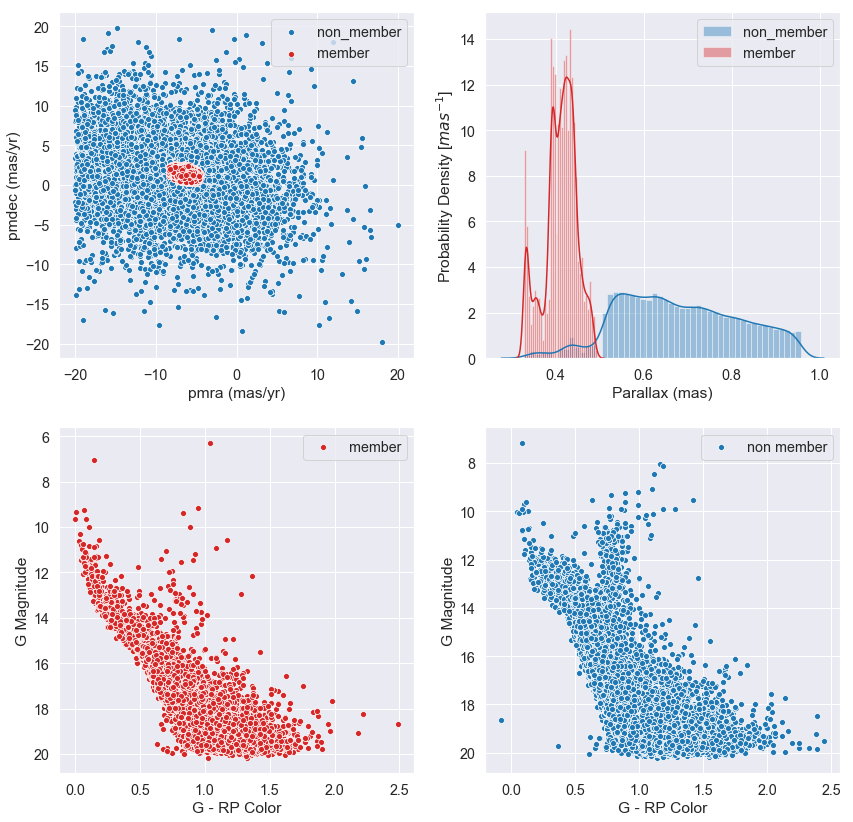

In [125]:
visualize_member(potentialMember, potential_non_member)

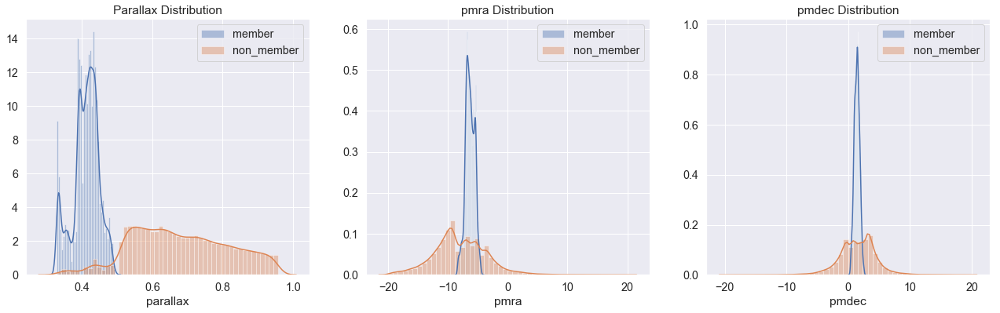

In [126]:
plt.figure(figsize = (22,6))

plt.subplot(131)
sns.distplot(potentialMember.parallax, label='member')
sns.distplot(potential_non_member.parallax, label = 'non_member')
plt.title('Parallax Distribution')
plt.legend()

plt.subplot(132)
sns.distplot(potentialMember.pmra, label='member')
sns.distplot(potential_non_member.pmra, label = 'non_member')
plt.title('pmra Distribution')
plt.legend()

plt.subplot(133)
sns.distplot(potentialMember.pmdec, label='member')
sns.distplot(potential_non_member.pmdec, label = 'non_member')
plt.title('pmdec Distribution')
plt.legend()

plt.show()

In [128]:
get_MSS_metric(potentialMember, potential_non_member, imp_feature_columns)

0.8065100676367237

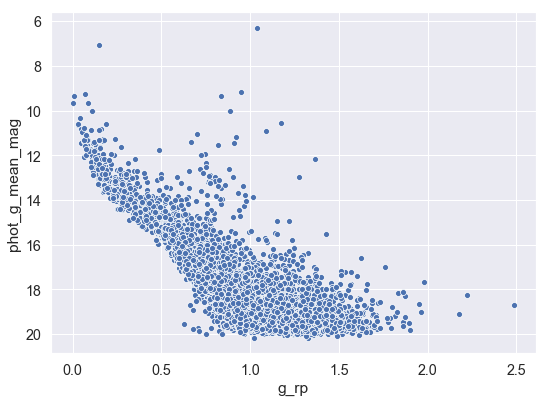

In [112]:
# CMD of predicted members 

cmd = sns.scatterplot(x = 'g_rp', y = 'phot_g_mean_mag',
                      data = potentialMember )
cmd.invert_yaxis()

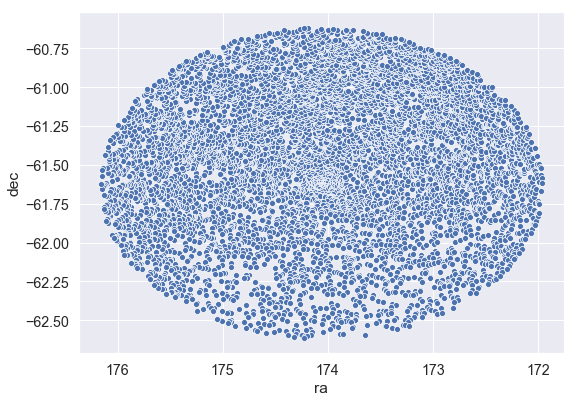

In [115]:
skyplot = sns.scatterplot(x = 'ra', y = 'dec', data = potentialMember )
skyplot.invert_xaxis()
plt.show()


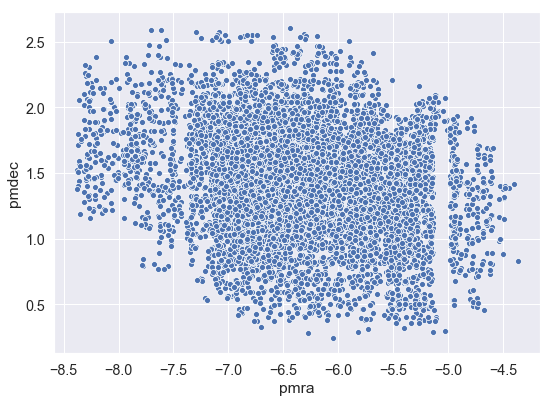

In [122]:
# pm plot
sns.scatterplot(x = 'pmra', y = 'pmdec',
                data = potentialMember)
plt.show()


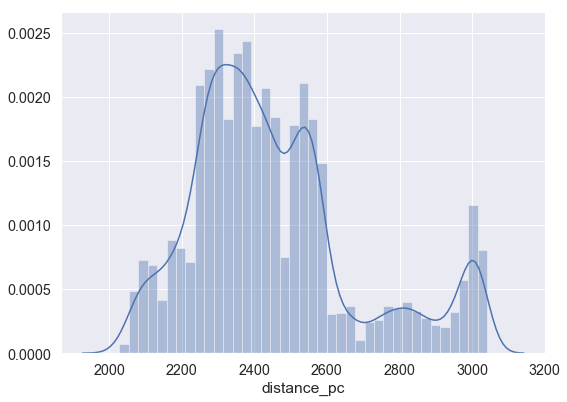

In [108]:
sns.distplot(member['distance_pc'], color = 'b', label = 'cantat', 
             kde=True)

### Compare with Cantat Benchmark 

#### Finding Cantat Data

In [85]:
#### Finding Cantat catalogue

catalog_list = Vizier.find_catalogs('Cantat')
{k:v.description for k,v in catalog_list.items()}

{'I/349': 'StarHorse, Gaia DR2 photo-astrometric distances (Anders+, 2019)',
 'I/354': 'StarHorse2, Gaia EDR3 photo-astrometric distances (Anders+, 2022)',
 'J/A+A/561/A94': 'Velocities and photometry in Trumpler 20 (Donati+, 2014)',
 'J/A+A/564/A133': 'Gaia FGK benchmark stars: metallicity (Jofre+, 2014)',
 'J/A+A/569/A17': 'Gaia-ESO Survey: NGC6705 (Cantat-Gaudin+, 2014)',
 'J/A+A/582/A81': 'Gaia FGK benchmark stars: abundances (Jofre+, 2015)',
 'J/A+A/588/A120': 'Equivalent widths in 10 open clusters (Cantat-Gaudin+, 2016)',
 'J/A+A/591/A37': 'Gaia-ESO Survey. Parameters for cluster members (Jacobson+, 2016)',
 'J/A+A/597/A10': 'South Ecliptic Pole stars radial velocities (Fremat+, 2017)',
 'J/A+A/598/A68': 'Gaia-ESO Survey. Trumpler 23 (Overbeek+, 2017)',
 'J/A+A/601/A19': 'Gaia DR1 open cluster members (Gaia Collaboration+, 2017)',
 'J/A+A/603/A2': 'Gaia-ESO Survey abundances radial distribution (Magrini+, 2017)',
 'J/A+A/605/A79': 'TGAS Cepheids and RR Lyrae stars (Gaia Collabora

In [98]:
## saving only NGC_3766 data from Cantat
Vizier.ROW_LIMIT = -1

cantat_data = Vizier(catalog = 'J/A+A/633/A99/members', row_limit = -1).query_constraints(Cluster="NGC_3766")
cantat_data = cantat_data[0].to_pandas()
cantat_data.head()

,RA_ICRS,DE_ICRS,Source,Plx,pmRA,pmDE,RV,Gmag,BP-RP,Proba,Cluster,_RA.icrs,_DE.icrs
0,174.195211,-61.479252,5335665295192871936,0.4705,-7.012,1.041,NaN,17.7374,1.1943,0.5,b'NGC_3766',174.195274,-61.479256
1,174.521895,-61.604049,5335659140506554752,0.4452,-6.705,0.834,NaN,17.8223,1.4727,0.2,b'NGC_3766',174.521956,-61.604052
2,174.447990,-61.635711,5335658831266493056,0.3478,-6.265,0.635,NaN,16.2775,0.9769,0.1,b'NGC_3766',174.448046,-61.635713
3,174.516866,-61.556410,5335660961569919232,0.4432,-6.704,0.777,NaN,12.1434,0.1415,0.3,b'NGC_3766',174.516927,-61.556414
4,174.439503,-61.377736,5335671205118524288,0.4133,-6.378,0.567,NaN,14.9205,0.9065,0.1,b'NGC_3766',174.439560,-61.377738


In [99]:
# renaming the cantat table to match it with gaia_data
cantat_data = cantat_data.rename(columns={'Source':'source_id',
                                          'Proba':'PMemb_cantat'})

# taking the subset of only source_id and PMemb
cantat_data = cantat_data.loc[:,['source_id', 'PMemb_cantat']]

# join the two table on source_id
cantat_data = GAIA_target_stars.join(cantat_data.set_index('source_id'), on='source_id')

# dropping the rows, where we don't have PMemb_cantat 
# (i.e. the source id was not in the cantat table)
cantat_data = cantat_data.dropna(subset=['PMemb_cantat'])
cantat_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,member,PMemb,PMemb_cantat
6,1635721458409799680,b'Gaia DR2 5334208407957823232',5334208407957823232,685551234,2015.5,174.055930,0.021324,-61.614974,0.018764,0.473014,...,13.423856,11.646379,15.201332,b'https://gea.esac.esa.int/data-server/datalin...,0.002628,0.000291,2114.104432,1,1.000000,1.0
14,1635721458409799680,b'Gaia DR2 5334208407957628544',5334208407957628544,1203797961,2015.5,174.062692,0.036982,-61.619452,0.033673,0.465970,...,7.572199,5.996381,9.148018,b'https://gea.esac.esa.int/data-server/datalin...,0.003540,0.000669,2146.060292,1,0.999200,0.2
21,1635721458409799680,b'Gaia DR2 5334208407957797120',5334208407957797120,1462919753,2015.5,174.067849,0.040567,-61.618733,0.044320,0.401176,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.004243,0.000311,2492.670568,1,0.999989,0.4
24,1635721458409799680,b'Gaia DR2 5334208403634203136',5334208403634203136,916084775,2015.5,174.063172,0.043489,-61.620707,0.035979,0.447387,...,1.933437,1.465721,2.401152,b'https://gea.esac.esa.int/data-server/datalin...,0.004815,0.001198,2235.200283,1,0.998143,1.0
43,1635721458409799680,b'Gaia DR2 5334208407957627136',5334208407957627136,1200288189,2015.5,174.047566,0.029160,-61.616451,0.028173,0.412694,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.006409,0.000543,2423.105516,1,0.999143,0.7


In [129]:
cantat_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,member,PMemb,PMemb_cantat
6,1635721458409799680,b'Gaia DR2 5334208407957823232',5334208407957823232,685551234,2015.5,174.055930,0.021324,-61.614974,0.018764,0.473014,...,13.423856,11.646379,15.201332,b'https://gea.esac.esa.int/data-server/datalin...,0.002628,0.000291,2114.104432,1,1.000000,1.0
14,1635721458409799680,b'Gaia DR2 5334208407957628544',5334208407957628544,1203797961,2015.5,174.062692,0.036982,-61.619452,0.033673,0.465970,...,7.572199,5.996381,9.148018,b'https://gea.esac.esa.int/data-server/datalin...,0.003540,0.000669,2146.060292,1,0.999200,0.2
21,1635721458409799680,b'Gaia DR2 5334208407957797120',5334208407957797120,1462919753,2015.5,174.067849,0.040567,-61.618733,0.044320,0.401176,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.004243,0.000311,2492.670568,1,0.999989,0.4
24,1635721458409799680,b'Gaia DR2 5334208403634203136',5334208403634203136,916084775,2015.5,174.063172,0.043489,-61.620707,0.035979,0.447387,...,1.933437,1.465721,2.401152,b'https://gea.esac.esa.int/data-server/datalin...,0.004815,0.001198,2235.200283,1,0.998143,1.0
43,1635721458409799680,b'Gaia DR2 5334208407957627136',5334208407957627136,1200288189,2015.5,174.047566,0.029160,-61.616451,0.028173,0.412694,...,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.006409,0.000543,2423.105516,1,0.999143,0.7


### Comparing the old and new predicted members

In [130]:
# creating subset for the member and Cantat Member

concatenated = pd.concat([potentialMember.assign(dataset='member_by_RF'), cantat_data.assign(dataset='cantat')])
concatenated.reset_index(drop=True)
concatenated.dataset.value_counts()

member_by_RF    7640
cantat          1368
Name: dataset, dtype: int64

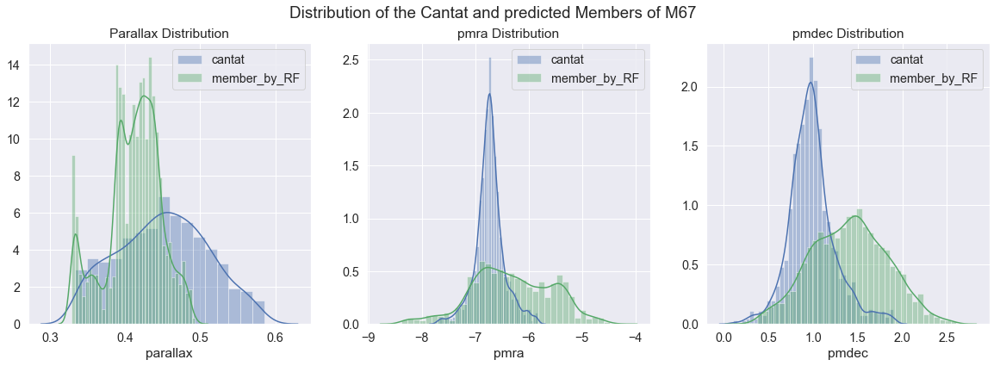

In [131]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Distribution of the Cantat and predicted Members of M67')


sns.distplot(cantat_data['parallax'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[0])
sns.distplot(potentialMember['parallax'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[0])
axes[0].set_title('Parallax Distribution')
axes[0].legend()

sns.distplot(cantat_data['pmra'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[1])
sns.distplot(potentialMember['pmra'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[1])
axes[1].set_title('pmra Distribution')
axes[1].legend()

sns.distplot(cantat_data['pmdec'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[2])
sns.distplot(potentialMember['pmdec'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[2])
axes[2].set_title('pmdec Distribution')
axes[2].legend()

plt.show()


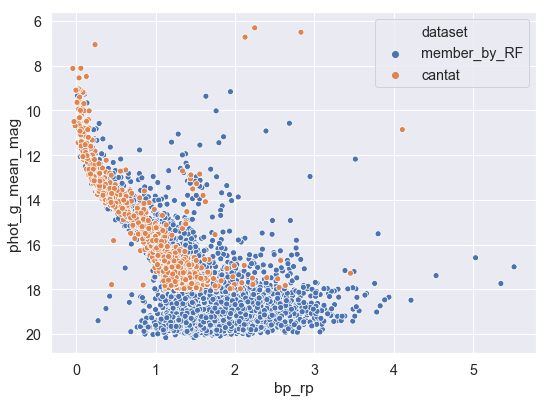

In [132]:
cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset')
cmd.invert_yaxis()

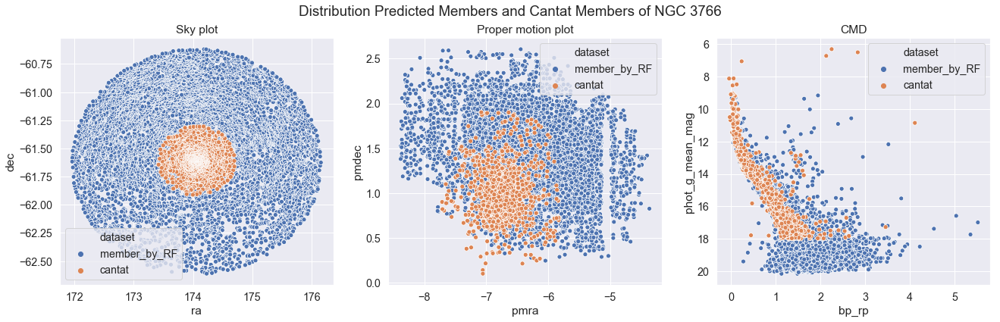

In [133]:
fig, axes = plt.subplots(1, 3, figsize=(22,6))
fig.suptitle('Distribution Predicted Members and Cantat Members of NGC 3766')

skyplot = sns.scatterplot(x='ra', y='dec', data=concatenated,
                hue='dataset', ax=axes[0])
axes[0].set_title('Sky plot')

# proper motion plot
sns.scatterplot(x='pmra', y='pmdec', data=concatenated,
                hue='dataset', ax=axes[1])
axes[1].set_title('Proper motion plot')

cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset', ax=axes[2])
cmd.invert_yaxis()
axes[2].set_title('CMD')

plt.show()

In [ ]:
# pd_prof.ProfileReport(potentialMember)

In [ ]:
#files.download('M_67_cantat.csv')

#files.download('M_67_membership_prob.csv')

ValueError: could not convert string to float: b'Gaia DR2 5334208407957823232'

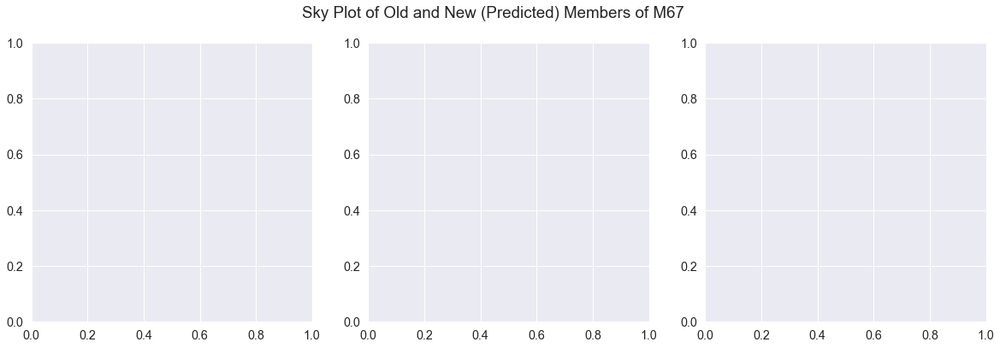

In [106]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Sky Plot of Old and New (Predicted) Members of M67')

sns.kdeplot(x='ra', y='dec', data = member, shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

sns.kdeplot(x='ra', y='dec', data = potentialMember, shade=True, color = 'blue', 
            bw_method = 0.20, cbar=True, ax=axes[1])
axes[1].set_title('New_member')

sns.kdeplot(x='ra', y='dec', data = concatenated.reset_index(drop=True), shade=True, color = 'g', 
            bw_method = 0.20, cbar=True, ax=axes[2])
axes[2].set_title('Old_member + New_member')

plt.show()

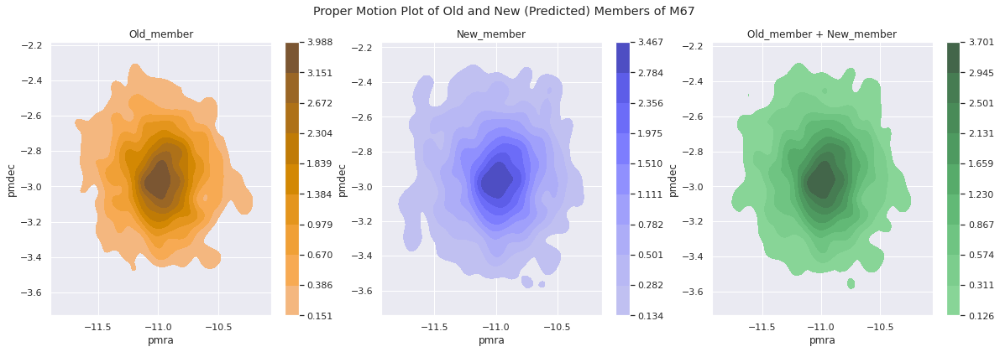

In [ ]:

fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Proper Motion Plot of Old and New (Predicted) Members of M67')

sns.kdeplot(x='pmra', y='pmdec', data = member, shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

sns.kdeplot(x='pmra', y='pmdec', data = potentialMember, shade=True, color = 'blue', 
            bw_method = 0.20, cbar=True, ax=axes[1])
axes[1].set_title('New_member')

sns.kdeplot(x='pmra', y='pmdec', data = concatenated.reset_index(drop=True), shade=True, color = 'g', 
            bw_method = 0.20, cbar=True, ax=axes[2])
axes[2].set_title('Old_member + New_member')

plt.show()

In [ ]:
from google.colab import files

In [109]:
#files.download('NGC_3766_cantat.csv')

potentialMember.to_csv('NGC_3766_additional_member_prob.csv')
concatenated.to_csv('NGC_3766_all_member_prob.csv')

#files.download('NGC_3766_all_member_prob.csv')
# column 'dataset': Old_member, New_member
# column 'member': 0 and 1
# column 'PMemb': decimal values between 0 to 1

#files.download('NGC_3766_additional_member_prob.csv')
